<div style="direction:rtl;line-height:300%;">
<font face="XB Zar" size=5>
<div align=center>
<font face="B Titr" size=5>
<p></p><p></p>
بسمه تعالی
<p></p>
</font>
<p></p>
<font>
<br>
درس بازیابی پیشرفته اطلاعات
<br>
مدرس: دکتر سلیمانی
</font>
<p></p>
<br>
<font>
<b>فاز دوم پروژه</b>
</font>
<br>
<br>
موعد تحویل: ۵ خرداد ۱۴۰۲ <br>
<br>
<br>
<br>
<font>
دانشگاه صنعتی شریف
<br>
دانشکده مهندسی کامپیوتر
<br>
<br>
</font>
</div>
</font>
</div>

<div dir="rtl">
<font face="XB Zar" size=4 >
سامانه‌های مبتنی بر یادگیری ماشین در بخش‌های مختلف از روش‌های یادگیری ماشین استفاده می‌کنند. دسته‌بندی و
خوشه‌بندی
دو کار مورد نیاز این سامانه‌ها هستند. در این تمرین به پیاده‌سازی این کارها با روش‌های مختلف و پیاده‌سازی قابلیت‌های جدید برای سیستم بازیابی روی مقالات علمی می‌پردازیم. دادگان این فاز را می‌توانید از
<a href="https://www.kaggle.com/datasets/spsayakpaul/arxiv-paper-abstracts?resource=download">این لینک</a>
دانلود کنید.
</font>
</div>

<div dir="rtl">
<font face="XB Zar" size=6>
    <h1>
    <b>دسته‌بندی توسط NaiveBayes (۱۸ نمره)</b>
    </h1>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
در این قسمت شما به دسته‌بندی اسناد می‌پردازید. برای این منظور، ابتدا برای هر سند، بردار مربوط به تعداد کلمات کل را بسازید و سپس classifier NaiveBaise را خودتان از پایه پیاده‌سازی کرده و اسناد را دسته‌بندی کنید.
در این تسک می‌توانید از کل دیتاست استفاده نکنید ولی باید دیتاست شما شامل هر سه کلاس موجود در دیتاست اصلی باشد.
</font>
</div>

<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>دانلود دیتاست و آشنایی با آن</b>
    </h2>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
در این قسمت دیتاست زیر را در kaggle دریافت کرده و ویژگی‌های آن را مشاهده کنید.
</font>
</div>

In [1]:
!pip install transformers
import torch
import nltk
import numpy as np
import pandas as pd
from tqdm import tqdm
from nltk import word_tokenize
import string
import zipfile
import json
import random
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
import torch
from transformers import BertTokenizer, BertForSequenceClassification, TrainingArguments, Trainer
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
!pip install --upgrade accelerate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
! pip install -q kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download -d spsayakpaul/arxiv-paper-abstracts

 94% 42.0M/44.6M [00:00<00:00, 87.1MB/s]
100% 44.6M/44.6M [00:00<00:00, 75.7MB/s]


In [3]:
import zipfile
with zipfile.ZipFile('arxiv-paper-abstracts.zip', 'r') as zip_ref:
    zip_ref.extractall('./')

In [4]:
df = pd.read_csv('arxiv_data.csv')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51774 entries, 0 to 51773
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   titles     51774 non-null  object
 1   summaries  51774 non-null  object
 2   terms      51774 non-null  object
dtypes: object(3)
memory usage: 1.2+ MB


<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>کاهش سایز دیتاست</b>
    </h2>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
    در این قسمت می‌توانید سایز دیتاست را به دلخواه کم کرده تا NaiveBayes عملکرد بهتری بتواند از خودش نشان دهد.
    کاهش سایز دیتاست می‌تواند باعث افزایش سرعت و حافظه‌ی مورد نیاز شود.
</font>
</div>

In [6]:
labels = df['terms'].apply(lambda x: x.split("'")[1]).values
df = pd.concat([df[labels == 'cs.CV'].sample(3500, replace=True), df[labels == 'stat.ML'].sample(3500, replace=True), df[labels == 'cs.LG'].sample(3500, replace=True)]).sample(frac=1).reset_index().drop(columns=['index'])
df

,titles,summaries,terms
0,Linear Polytree Structural Equation Models: St...,We are interested in the problem of learning t...,"['stat.ML', 'cs.LG', 'math.ST', 'stat.ME', 'st..."
1,On the consistency of supervised learning with...,"In many application settings, the data have mi...","['stat.ML', 'cs.LG', 'math.ST', 'stat.TH']"
2,Zeroth-Order Algorithms for Nonconvex Minimax ...,"In this paper, we study zeroth-order algorithm...","['stat.ML', 'cs.DS', 'cs.LG', 'math.OC']"
3,Multiplicative noise and heavy tails in stocha...,Although stochastic optimization is central to...,"['stat.ML', 'cs.LG', 'math.OC', 'math.ST', 'st..."
4,Curriculum learning for multilevel budgeted co...,Learning heuristics for combinatorial optimiza...,"['cs.LG', 'cs.GT', 'stat.ML']"
...,...,...,...
10495,"Ergodic Limits, Relaxations, and Geometric Pro...",Random walk based node embedding algorithms le...,"['stat.ML', 'cs.LG']"
10496,Probabilistic Attention for Interactive Segmen...,We provide a probabilistic interpretation of a...,"['cs.CV', 'cs.AI', 'cs.LG', '68T07', 'I.5.1; I..."
10497,Consensus Based Medical Image Segmentation Usi...,Medical image segmentation requires consensus ...,['cs.CV']
10498,Learning to Globally Edit Images with Textual ...,We show how we can globally edit images using ...,['cs.CV']


<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>پیش‌پردازش دیتاست</b>
    </h2>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
    در این قسمت می‌توانید با استفاده از تابع زیر یا توابعی که در فاز 1 تعریف کردید به پیش‌پردازش دیتاست بپردازید.
    داده‌ای که با آن در این بخش کار می‌کنید چند برچسبی می‌باشند. اما برای این بخش ما تنها برچسب اول از هر مقاله را در نظر می‌گیریم و به صورت تک برچسبی به داده‌ها نگاه می‌کنیم.
</font>
</div>

In [7]:
def preprocess_text(text, minimum_length=1, stopword_removal=True, stopwords_domain=[], lower_case=True,
                       punctuation_removal=True):
    
    normalized_tokens = word_tokenize(text)

    if stopword_removal:
        # Remove stopwords in English and also the given domain stopwords
        stopwords = [x.lower() for x in nltk.corpus.stopwords.words('english')]
        domain_stopwords = [x.lower() for x in stopwords_domain]
        normalized_tokens = [word for word in normalized_tokens if word.lower() not in domain_stopwords + stopwords]

    if punctuation_removal:
        # Remove punctuations
        normalized_tokens = [word for word in normalized_tokens if word not in string.punctuation]

    if lower_case:
        # Convert everything to lowercase and filter based on a min length
        normalized_tokens = [word.lower() for word in normalized_tokens if len(word) > minimum_length]
    else:
        normalized_tokens = [word for word in normalized_tokens if len(word) > minimum_length]

    return normalized_tokens

In [8]:
nltk.download('punkt')
nltk.download('stopwords')
words = (df['titles'].apply(preprocess_text) + df['summaries'].apply(preprocess_text)).values
labels = df['terms'].apply(lambda x: x.split("'")[1]).values

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>آماده‌سازی دیتای train و test</b>
    </h2>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
    در این قسمت با ساخت ماتریس doc-word می‌توانید دیتای مورد نیاز برای NaiveBayes را آماده کنید. در این ماتریس هر سطر نشان‌دهنده آیدی داکیومنت و هر ستون نشان‌دهنده یک کلمه در کل vocabulary شما می‌باشد.
   همچنین می‌توانید از CountVectorizer استفاده کنید. 
</font>
</div>

In [9]:
# one hot encode words
count_vectorizer = CountVectorizer(tokenizer=lambda x: x, preprocessor=lambda x: x)
vectorized = count_vectorizer.fit_transform(words).toarray()

# decode classes into numbers
inverse_classes = dict()
classes = dict()
for i, classe in enumerate(np.unique(labels)):
  classes[classe] = i
  inverse_classes[i] = classe
y = np.vectorize(lambda x: classes[x])(labels)

# split into train and test set
X_train, X_test, y_train, y_test = train_test_split(vectorized, y)

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>دسته‌بندی با استفاده از NaivaBayes</b>
    </h2>
    در این بخش کلاس زیر را تکمیل نمایید تا classifier NaiveBayes را <u><b>از پایه</b></u> پیاده‌سازی کنید.
</font>
</div>

In [10]:
class NaiveBayes():
    def __init__(self, alpha=1.0):
        self.prior = None
        self.word_counts = None
        self.lk_word = None
        self.classes = None
        self.alpha = alpha
        
    def fit(self, x, y):
        '''
        Fit the features and the labels
        Calculate prior, word_counts and lk_word
        
        Parameters
        ----------
        x: np.ndarray
            An m * n matrix - m is count 
            of docs and n is size of vocabulary

        y: np.ndarray
            The real class label for each doc
            
        Returns
        -------
        self
            Returns self as a classifier
        '''
        # calculate priors
        self.prior = np.zeros(len(np.unique(y)))
        for label in np.unique(y):
          self.prior[label] = np.log((y == label).sum() / len(y))
        
        # calculate word likelihoods
        self.lk_word = np.zeros((self.prior.shape[0], x.shape[1]))
        for label in np.unique(y):
          all_samples = x[y == label]
          self.lk_word[label] = np.log((all_samples.sum(axis=0) + self.alpha / all_samples.shape[1])  / (all_samples.sum() + self.alpha))

        return self

    def get_logits(self, x):
      return (x[:, np.newaxis,:] * self.lk_word).sum(axis=2) + self.prior

    def predict(self, x):
        '''
        Parameters
        ----------
        x: np.ndarray
            An k * n matrix - k is count 
            of docs and n is vocabulary size
        
        Returns
        -------
        np.ndarray
            Return the predicted class for each doc
            with the highest probability (argmax)
        '''
        
        probs = self.get_logits(x)
        return probs.argmax(axis=1)

In [11]:
# use your classifier to fit on the training data
# then try to predict classes of test data
model = NaiveBayes()
model.fit(X_train, y_train)
predictions = model.predict(X_test)

<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>ارزیابی مدل train شده</b>
    </h2>
    در این بخش precision، recall، F1 score را در حالت macro و micro
    و accuracy مدل
    را با استفاده از sklearn به دست آورید.
</font>
</div>

In [12]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
# calculate accuracy
accuracy = accuracy_score(y_test, predictions)
print(f'accuracy of the model is: {accuracy}')

# cacluate micro and macro recall
micro_recall = recall_score(y_test, predictions, average='micro')
macro_recall = recall_score(y_test, predictions, average='macro')
print(f'micro and macro recall of the model are: {micro_recall, macro_recall}')

# calculate micro and macro precision
micro_precision = precision_score(y_test, predictions, average='micro')
macro_precision = precision_score(y_test, predictions, average='macro')
print(f'micro and macro precision of the model are: {micro_precision, macro_precision}')

# calculate micro and macro f1
micro_f1 = f1_score(y_test, predictions, average='micro')
macro_f1 = f1_score(y_test, predictions, average='macro')
print(f'micro and macro f1 of the model are: {micro_f1, macro_f1}')

accuracy of the model is: 0.8445714285714285
micro and macro recall of the model are: (0.8445714285714285, 0.8432638777804159)
micro and macro precision of the model are: (0.8445714285714285, 0.8430785892126722)
micro and macro f1 of the model are: (0.8445714285714285, 0.8429337878868348)


<div dir="rtl">
<font face="XB Zar" size=4>
در بخش پایین roc curve مربوط به این دسته‌بندی non-binary را به دست آورده و به صورت مختصر تحلیل کنید.
</div>
</font>

roc-auc score is : 0.9457119224388859


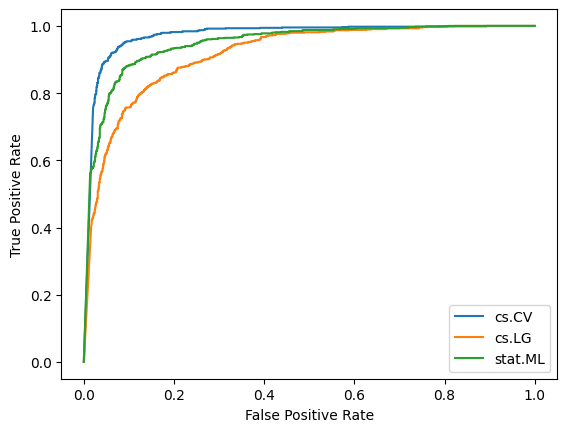

In [13]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt


fig, ax = plt.subplots()

# get logits from model
logits = model.get_logits(X_test)

# subtract maximum from each row to make computation numerically stable
logits -= logits.max(axis=1, keepdims=True)

# compute probabilities from logits
probs = np.exp(logits) / np.exp(logits).sum(axis=1, keepdims=True)

# plot each roc_curve separatly
for i in range(3):
  binary = (y_test == i)
  fpr, tpr, _ = roc_curve(binary, probs[:, i])
  ax.plot(fpr, tpr, label=inverse_classes[i])
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend()

# print the roc-auc score
print('roc-auc score is :', roc_auc_score(y_test, probs / probs.sum(axis=1, keepdims=True), multi_class='ovr'))

<div dir="rtl">
<font face="XB Zar" size=3>
دسته بند قدرت تصمیم گیری زیادتری در دسته cs.CV دارد به این معنا که میتواند بهتر آن را از بقیه کلاس ها تشخیص دهد و سپس قدرت تشخیص stat.ML و سپس cs.LG قرار دارد.
</font>
</div>

<div dir="rtl">
<font face="XB Zar" size=4>
در این بخش confusion matrix را بدون استفاده از sklearn و به کمک matplotlib و seaborn بکشید.
</font>
</div>

<Axes: >

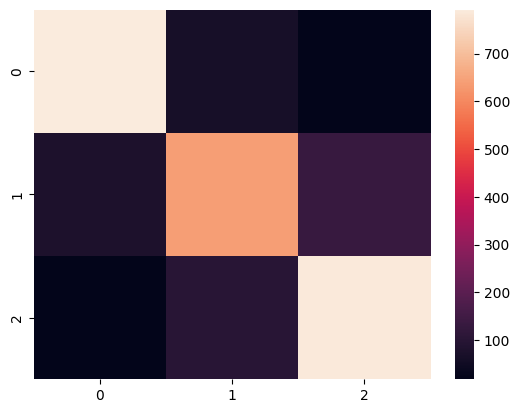

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# compute the confusion matrix
ans = np.zeros((3, 3))
for i in range(3):
  for j in range(3):
    ans[i][j] = np.logical_and(y_test == i, predictions == j).sum()

# plot the heatmap of confusion matrix
sns.heatmap(ans)

<div dir="rtl">
<font face="XB Zar" size=5>
    <h1>
    <b>دسته بندی با شبکه های عصبی (۳۲ نمره)</b>
    </h1>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
     <br>
    شما یک مجموعه داده از مقالات علمی دارید، هرکدام با یک چکیده و موضوع مربوطه نشان داده شده است. هدف ساختن یک مدل شبکه عصبی است که بتواند بر اساس چکیده مقاله علمی و عنوان آن، موضوع آن را پیش بینی کند.
</font>
</div>
   

<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>داده ها</b>
    </h2>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
     <br>
    داده‌ای که با آن در این بخش کار می‌کنید چند برچسبی می‌باشند. اما برای این بخش ما تنها برچسب اول از هر مقاله را در نظر می‌گیریم و به صورت تک برچسبی به داده‌ها نگاه می‌کنیم.
</font>
</div>
   

## Requirements

In [15]:
# You may not use all of these imports, but they are here to help you get started
# you can add cells if you needed

!pip install fasttext
import nltk
import numpy as np
import pandas as pd
from tqdm import tqdm
from nltk import word_tokenize
import string
from sklearn.model_selection import train_test_split
import torch
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
import fasttext
import os
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
import re
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from time import time
from IPython.display import display

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.8/68.8 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached pybind11-2.10.4-py3-none-any.whl (222 kB)
  Created wheel for fasttext: filename=fasttext-0.9.2-cp310-cp310-linux_x86_64.whl size=4393346 sha256=7dc78123fc3647246daa6f24487adfd2ee657da23b408875d541c476535491e5
  Stored in directory: /root/.cache/pip/wheels/a5/13/75/f811c84a8ab36eedbaef977a6a58a98990e8e0f1967f98f394
Successfully built fasttext


## Read and preprocess data


<div dir="rtl">
<font face="XB Zar" size=5>
</font>
<font face="XB Zar" size=3>
     <br>
در ابتدا دیتا را لود کنید. آن را تمیز کنید یا به عبارتی EDA مناسب در حدی که داده‌های null یا موارد این‌چنینی نداشته باشیم، بر روی آن انجام دهید.
 پیش پردازش‌های مورد نیاز که در فاز قبل با آن آشنا شدید را روی داده انجام دهید.
    برای کتگوری هر مقاله برچسب اول آن را از دیتاست در نظر بگیرید.
</font>
</div>

In [16]:
# read data
df = pd.read_csv('./arxiv_data.csv')

# drop duplicates
df.drop_duplicates(subset=['titles'], inplace=True)

# equalize the counts of each class
labels = df['terms'].apply(lambda x: x.split("'")[1]).values
df = pd.concat([df[labels == 'cs.CV'].sample(3500, replace=True), df[labels == 'stat.ML'].sample(3500, replace=True), df[labels == 'cs.LG'].sample(3500, replace=True)]).sample(frac=1).reset_index().drop(columns=['index'])
df

,titles,summaries,terms
0,AWGAN: Empowering High-Dimensional Discriminat...,Empirically multidimensional discriminator (cr...,"['stat.ML', 'cs.LG']"
1,Stable Policy Optimization via Off-Policy Dive...,Trust Region Policy Optimization (TRPO) and Pr...,"['cs.LG', 'stat.ML']"
2,Modeling Explicit Concerning States for Reinfo...,To encourage AI agents to conduct meaningful V...,['cs.CV']
3,Policy Finetuning: Bridging Sample-Efficient O...,Recent theoretical work studies sample-efficie...,"['cs.LG', 'stat.ML']"
4,nnFormer: Interleaved Transformer for Volumetr...,"Transformers, the default model of choices in ...",['cs.CV']
...,...,...,...
10495,Double Descent and Other Interpolation Phenome...,We study overparameterization in generative ad...,['cs.LG']
10496,MetAL: Active Semi-Supervised Learning on Grap...,The objective of active learning (AL) is to tr...,"['stat.ML', 'cs.LG']"
10497,Analysis of high-dimensional Continuous Time M...,Sampling the parameters of high-dimensional Co...,"['stat.ML', 'cs.LG', 'stat.CO']"
10498,Initialization and Regularization of Factorize...,Factorized layers--operations parameterized by...,"['stat.ML', 'cs.AI', 'cs.CL', 'cs.CV', 'cs.LG']"


In [17]:
# there is no nan
df.isna().sum(axis=0)

titles       0
summaries    0
terms        0
dtype: int64

In [18]:
def preprocess_text(text, minimum_length=1, stopword_removal=True, stopwords_domain=[], lower_case=True,
                       punctuation_removal=True):
    """
    preprocess text by removing stopwords, punctuations, and converting to lowercase, and also filter based on a min length
    for stopwords use nltk.corpus.stopwords.words('english')
    for punctuations use string.punctuation

    Parameters
    ----------
    text: str
        text to be preprocessed
    minimum_length: int
        minimum length of the token
    stopword_removal: bool
        whether to remove stopwords
    stopwords_domain: list
        list of stopwords to be removed base on domain
    lower_case: bool
        whether to convert to lowercase
    punctuation_removal: bool
        whether to remove punctuations
    """
    if punctuation_removal:
        # Remove punctuations
        text = re.sub(r'[^\w\s]', '', text)
    
    normalized_tokens = word_tokenize(text)

    if stopword_removal:
        # Remove stopwords in English and also the given domain stopwords
        stopwords = [x.lower() for x in nltk.corpus.stopwords.words('english')]
        domain_stopwords = [x.lower() for x in stopwords_domain]
        normalized_tokens = [word for word in normalized_tokens if word.lower() not in domain_stopwords + stopwords]

    if lower_case:
        # Convert everything to lowercase and filter based on a min length
        normalized_tokens = [word.lower() for word in normalized_tokens if len(word) > minimum_length]
    else:
        normalized_tokens = [word for word in normalized_tokens if len(word) > minimum_length]

    return normalized_tokens


<div dir="rtl">
<font face="XB Zar" size=5>
</font>
<font face="XB Zar" size=3>
     <br>

</font>
</div>

In [19]:
# preprocess text
df['preprocessed_abstract'] = df['summaries'].apply(lambda x: preprocess_text(x))
df['preprocessed_title'] = df['titles'].apply(lambda x: preprocess_text(x))
preprocessed_total = df['preprocessed_abstract'] + df['preprocessed_title']

In [20]:
preprocessed_total = preprocessed_total.tolist()
labels = df['terms'].apply(lambda x: x.split("'")[1]).values
preprocessed_total[0]

['empirically',
 'multidimensional',
 'discriminator',
 'critic',
 'output',
 'advantageous',
 'solid',
 'explanation',
 'discussed',
 'paper',
 'rigorously',
 'prove',
 'highdimensional',
 'critic',
 'output',
 'advantage',
 'distinguishing',
 'real',
 'fake',
 'distributions',
 'ii',
 'also',
 'introduce',
 'squareroot',
 'velocity',
 'transformation',
 'srvt',
 'block',
 'magnifies',
 'advantage',
 'proof',
 'based',
 'proposed',
 'maximal',
 'pcentrality',
 'discrepancy',
 'bounded',
 'pwasserstein',
 'distance',
 'perfectly',
 'fits',
 'wasserstein',
 'gan',
 'framework',
 'highdimensional',
 'critic',
 'output',
 'also',
 'showed',
 'proposed',
 'discrepancy',
 'equivalent',
 '1wasserstein',
 'distance',
 'srvt',
 'block',
 'applied',
 'break',
 'symmetric',
 'structure',
 'highdimensional',
 'critic',
 'output',
 'improve',
 'generalization',
 'capability',
 'discriminator',
 'network',
 'terms',
 'implementation',
 'proposed',
 'framework',
 'require',
 'additional',
 'hyperpar

## Vectorize data


<div dir="rtl">
<font face="XB Zar" size=5>
</font>
<font face="XB Zar" size=3>
     <br>
در این قسمت از fasttext کمک می‌گیریم تا به یک embedding اولیه برای هر مقاله برسیم.
    با استفاده از داده‌هایی که داریم یک مدل fasttext آموزش دهید که برای هر توکن یک امبدینگ ۱۰۰تایی بدهد.
    در مرحله‌ی بعد میانگین وزن دار امبدینگ های fasttext
        توکن‌های ورودی (چکیده + عنوان)
    را بر اساس tfidif آن‌ها محاسبه کنید و به امبدینگ نهایی متن برسید.
    <br>
    در واقع به عبارت ساده‌تر بر اساس میانگین وزن‌دار که وزن‌های ما tfidf توکن‌ها می‌باشد به امبدینگ نهایی متن بر اساس fasttext می‌رسیم.
    </font>
</div>

In [21]:
class FastText:

    def __init__(self, preprocessor=None, method='skipgram'):
        self.method = method
        self.model = None
        self.preprocessor = preprocessor

    def train(self, texts):
        """
        train the fasttext model and save it into self.model
        Parameters
        ----------
        texts: list of list of str
        """
        with open('temp.txt', 'w') as f:
          f.write('\n'.join([' '.join(r) for r in texts]))
        f.close()
        self.model = fasttext.train_unsupervised('temp.txt', model=self.method)
        os.remove('temp.txt')

    def get_query_embedding(self, query, tf_idf_vectorizer):
        """
        get the embedding of the query. You can use the tf_idf_vectorizer to get the weights of the words in the query. preprocess the query using self.preprocessor if it is not None
        Parameters
        ----------
        query: str
        tf_idf_vectorizer: TfidfVectorizer
        Returns embedding of the query
        """
        words = self.preprocessor(query)
        vectorized_query = tf_idf_vectorizer.transform([' '.join(words)])
        vocab = tf_idf_vectorizer.vocabulary_
        weights = np.array([vectorized_query[0, vocab[word]] for word in words])
        query_embed = (weights.reshape((-1, 1)) * \
        np.array([self.model.get_word_vector(r) for r in words])).sum(axis=0) / weights.sum()
        return query_embed

    def save_FastText_model(self, path='FastText_model.bin'):
        self.model.save_model(path)
  
    def load_FastText_model(self, path="FastText_model.bin"):
        self.model = fasttext.load_model(path)

    def prepare(self, dataset, mode, save=False):
        if mode == 'train':
            self.train(dataset)
        if mode == 'load':
            self.load_FastText_model()
        if save:
            self.save_FastText_model()

In [22]:
FastText_model = FastText(preprocessor=preprocess_text)
FastText_model.prepare(preprocessed_total, mode='train', save=True)
# FastText_model.prepare(preprocessed_total, mode='load')

In [23]:
text = 'covid'

FastText_model.model.get_nearest_neighbors(text)

[(0.8792681097984314, 'covid19'),
 (0.7568495273590088, 'cohort'),
 (0.7561962604522705, 'hvf'),
 (0.7437487244606018, 'copd'),
 (0.7434462904930115, 'fifteen'),
 (0.735750675201416, 'gf2'),
 (0.732150673866272, '61'),
 (0.7245432734489441, 't2d'),
 (0.7197293639183044, 'cohorts'),
 (0.7178648710250854, '115')]

In [24]:
class TF_IDF:

    def __init__(self):
        self.vectorizer = TfidfVectorizer(preprocessor=lambda x: x, tokenizer=lambda x: x.split(' '))

    def fit_vectorizer(self, data):
        """
        fit the vectorizer on the data
        Parameters
        ----------
        data: list of list of str
        """
        self.vectorizer.fit([' '.join(r) for r in data])

In [25]:
TF_IDF_model = TF_IDF()
TF_IDF_model.fit_vectorizer(preprocessed_total)

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [26]:
text = 'backpropagation is good'
TF_IDF_model.vectorizer.transform([text])
FastText_model.get_query_embedding(text, TF_IDF_model.vectorizer)

array([-0.26540094,  0.0315244 , -0.29541859,  0.20326307, -0.22520416,
       -0.41114219, -0.27633305,  0.21976606,  0.20387773, -0.10567957,
        0.37033729,  0.08285061, -0.17538525, -0.03451828,  0.13667774,
        0.10903756, -0.08080747, -0.27610247, -0.18723537, -0.0181567 ,
        0.07402273,  0.02974055, -0.02028306, -0.2001068 ,  0.19521055,
       -0.28416307,  0.17486848, -0.33405046, -0.21440503,  0.27360692,
        0.300537  , -0.30061197, -0.23771675,  0.5020943 , -0.0117003 ,
        0.29784149, -0.5105661 , -0.27102219, -0.09929196,  0.09141307,
        0.17342722, -0.22254605,  0.00189743, -0.44280967, -0.06166611,
       -0.2882782 , -0.03633899, -0.29589755,  0.00084351, -0.11351153,
        0.12201678, -0.35394934,  0.23188758,  0.18270443,  0.03089331,
       -0.26056765,  0.02643134, -0.31774729,  0.323955  ,  0.06779767,
        0.16225252,  0.02775498,  0.00386651,  0.24603903, -0.06475655,
        0.16466341,  0.1534857 ,  0.03773171,  0.07949334,  0.66


<div dir="rtl">
<font face="XB Zar" size=5>
</font>
<font face="XB Zar" size=3>
     <br>
حال به کمک مدلی که نوشته‌اید دیتای ورودی شبکه‌ی عصبی را بسازید.
    به عبارتی به ازای هر مقاله embedding مربوطه را بدست آورید.
    همچنین برچسب‌ها را نیز به عدد تبدیل کنید تا برای شبکه‌ی عصبی قابل فهم باشد.
    </font>
</div>

In [27]:
embeddings = []
for preprocessed in preprocessed_total:
  sentence = ' '.join(preprocessed)
  embeddings.append(FastText_model.get_query_embedding(sentence, TF_IDF_model.vectorizer))
embeddings = np.array(embeddings)

# encode labels
classes = dict()
for i, classe in enumerate(np.unique(labels)):
  classes[classe] = i
y = np.vectorize(lambda x: classes[x])(labels)

## Prepare data for model


<div dir="rtl">
<font face="XB Zar" size=5>
</font>
<font face="XB Zar" size=3>
     <br>
     در این قسمت dataset ورودی شبکه‌ی عصبی را بسازید.
     همچنین دیتا‌ را به قسمت‌های train test validation تقسیم کنید.
     80% داده برای آموزش
     10% را برای  validation
     و 10% را برای تست در نظر بگیرید.
     در نهایت dataloaderهای مربوطه را بسازید.
    </font>
</div>

In [28]:
class PapersDataSet(Dataset):
    def __init__(self, embeddings: list, labels: list):
        self.X = embeddings
        self.y = labels
        
    def __len__(self):
        return len(self.y)

    def __getitem__(self, i):
        return self.X[i], self.y[i]

In [29]:
# todo calculate the labels
labels = None

In [30]:
# split into train, validation and test
X_train, X_test, y_train, y_test = train_test_split(embeddings, y, test_size=0.2)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5)

# create corresponding datasets
train_data = PapersDataSet(X_train, y_train)
val_data = PapersDataSet(X_val, y_val)
test_data = PapersDataSet(X_test, y_test)

# create the dataloaders
train_loader = DataLoader(train_data, batch_size=128)
val_loader = DataLoader(val_data, batch_size=128)
test_loader = DataLoader(test_data, batch_size=128)

## Build model


<div dir="rtl">
<font face="XB Zar" size=5>
</font>
<font face="XB Zar" size=3>
     <br>
حال دراین قسمت مدل شبکه‌ی عصبی خود را تعریف کنید.
    </font>
</div>

In [31]:
class ClassifierModel(nn.Module):
    def __init__(self, in_features=100, num_classes=3):
        super().__init__()
        self.first_layer = nn.Linear(in_features, 64)
        self.second_layer = nn.Linear(64, num_classes)

    def forward(self, x):
        x = self.first_layer(x)
        x = nn.ReLU()(x)
        x = self.second_layer(x)
        return x

## Train model



<div dir="rtl">
<font face="XB Zar" size=5>
</font>
<font face="XB Zar" size=3>
     <br>
در این قسمت به کمک داده‌ی آموزش و validation مدل خود را آموزش دهید.
اطلاعات مورد نیاز نظیر lossهای train و validation را ذخیره کنید تا در ادامه به کمک نمودار یادگیری مدل خود را ارزیابی کنید.
    </font>
</div>

In [32]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ClassifierModel().to(device)

In [33]:
# todo define the loss function and the optimizer. We suggest using Adam optimizer
criterion = nn.CrossEntropyLoss().to(device)
learning_rate = 0.005
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [34]:
def eval_epoch(model: nn.Module, criterion: nn.Module, dataloader: torch.utils.data.DataLoader, test_mode=False):
    """
    Evaluate the model on the given dataloader. used for validation and test
    Parameters
    ----------
    model: nn.Module
    criterion: nn.Module
    dataloader: torch.utils.data.DataLoader
    test_mode: bool
        If True, the function will print 'Test' instead of 'Validation'
    Returns
    -------
    eval_loss: float
        The loss on the given dataloader
    predicted_labels: list
        The predicted labels
    true_labels: list
        The true labels
    f1_score_macro: float
        The f1 score on the given dataloader
    """
    eval_loss = 0
    predicted_labels = []
    true_labels = []


    with torch.no_grad(), tqdm(enumerate(dataloader)) as pbar:
      for i, (x, y) in pbar:
        # put everything into cuda
        x = x.to(device)
        y = y.to(device)

        # make predictions
        y_hat = model(x.to(torch.float32))

        # add the loss
        loss = criterion(y_hat, y)
        eval_loss += float(loss)

        # add predictions
        predictions = y_hat.argmax(-1)
        predicted_labels.extend(predictions.tolist())

        # add true labels
        true_labels.extend(y.tolist())

    # compute f1 score
    f1_score_macro = f1_score(true_labels, predicted_labels, average='macro')

    return eval_loss, predicted_labels, true_labels, f1_score_macro

In [35]:
"""
Train the model for num_epochs epochs
epoch_true and epoch_all are used to calculate the accuracy.
epoch_true is the number of correct predictions and epoch_all is the total number of predictions in the epoch
"""
num_epochs = 400

train_loss_arr, val_loss_arr = [], []
f1_macro_scores = []
for epoch in range(num_epochs):
  start_time = time()

  train_loss, val_loss = 0, 0
  epoch_all = 0
  epoch_true = 0

  model.train()
  
  with tqdm(enumerate(train_loader), total=len(train_loader)) as pbar:
    for i, (x, y) in pbar:
      # put everything into cuda
      x = x.to(device)
      y = y.to(device)

      # make predictions
      y_hat = model(x.to(torch.float32))

      # compute loss
      loss = criterion(y_hat, y)
      train_loss += float(loss)

      # backprop and update parameters
      loss.backward()
      optimizer.step()
      optimizer.zero_grad()

  model.eval()
  
  val_loss, predicted_labels, true_labels, f1_score_macro = eval_epoch(model, criterion, val_loader)
  
  train_loss /= len(train_loader.dataset)
  val_loss /= len(val_loader.dataset)
  train_loss_arr.append(train_loss)
  val_loss_arr.append(val_loss)
  f1_macro_scores.append(f1_score_macro)
  
  end_time = time()
  
  print(f'Epoch {epoch + 1} finished in {end_time - start_time:.2f}s')

  print(f"[Epoch {epoch + 1}]\t"
      f"Train Loss: {train_loss:.4f}\t"
      f"Validation Loss: {val_loss:.4f}\t F1 score macro: {f1_score_macro}")

100%|██████████| 66/66 [00:03<00:00, 21.91it/s]
9it [00:00, 620.31it/s]


Epoch 1 finished in 3.06s
[Epoch 1]	Train Loss: 0.0055	Validation Loss: 0.0048	 F1 score macro: 0.7676118133720351


100%|██████████| 66/66 [00:00<00:00, 535.93it/s]
9it [00:00, 900.90it/s]


Epoch 2 finished in 0.15s
[Epoch 2]	Train Loss: 0.0046	Validation Loss: 0.0048	 F1 score macro: 0.7697259816928718


100%|██████████| 66/66 [00:00<00:00, 521.47it/s]
9it [00:00, 865.82it/s]


Epoch 3 finished in 0.16s
[Epoch 3]	Train Loss: 0.0046	Validation Loss: 0.0048	 F1 score macro: 0.7758410010680935


100%|██████████| 66/66 [00:00<00:00, 521.75it/s]
9it [00:00, 981.89it/s]


Epoch 4 finished in 0.16s
[Epoch 4]	Train Loss: 0.0045	Validation Loss: 0.0048	 F1 score macro: 0.7770350030164694


100%|██████████| 66/66 [00:00<00:00, 500.08it/s]
9it [00:00, 772.02it/s]


Epoch 5 finished in 0.17s
[Epoch 5]	Train Loss: 0.0045	Validation Loss: 0.0047	 F1 score macro: 0.7766713604075483


100%|██████████| 66/66 [00:00<00:00, 518.57it/s]
9it [00:00, 864.51it/s]


Epoch 6 finished in 0.16s
[Epoch 6]	Train Loss: 0.0044	Validation Loss: 0.0047	 F1 score macro: 0.7711106251674688


100%|██████████| 66/66 [00:00<00:00, 528.29it/s]
9it [00:00, 862.12it/s]


Epoch 7 finished in 0.16s
[Epoch 7]	Train Loss: 0.0044	Validation Loss: 0.0047	 F1 score macro: 0.7710459416817738


100%|██████████| 66/66 [00:00<00:00, 496.13it/s]
9it [00:00, 776.90it/s]


Epoch 8 finished in 0.17s
[Epoch 8]	Train Loss: 0.0044	Validation Loss: 0.0047	 F1 score macro: 0.7720722585749699


100%|██████████| 66/66 [00:00<00:00, 507.64it/s]
9it [00:00, 840.60it/s]


Epoch 9 finished in 0.16s
[Epoch 9]	Train Loss: 0.0043	Validation Loss: 0.0047	 F1 score macro: 0.7767941714669434


100%|██████████| 66/66 [00:00<00:00, 536.08it/s]
9it [00:00, 706.14it/s]


Epoch 10 finished in 0.16s
[Epoch 10]	Train Loss: 0.0043	Validation Loss: 0.0046	 F1 score macro: 0.7728764311489146


100%|██████████| 66/66 [00:00<00:00, 530.77it/s]
9it [00:00, 923.29it/s]


Epoch 11 finished in 0.16s
[Epoch 11]	Train Loss: 0.0042	Validation Loss: 0.0046	 F1 score macro: 0.7796170204064942


100%|██████████| 66/66 [00:00<00:00, 507.72it/s]
9it [00:00, 735.23it/s]


Epoch 12 finished in 0.16s
[Epoch 12]	Train Loss: 0.0042	Validation Loss: 0.0046	 F1 score macro: 0.7803726816643263


100%|██████████| 66/66 [00:00<00:00, 445.21it/s]
9it [00:00, 637.23it/s]


Epoch 13 finished in 0.19s
[Epoch 13]	Train Loss: 0.0041	Validation Loss: 0.0046	 F1 score macro: 0.7809771006090025


100%|██████████| 66/66 [00:00<00:00, 357.59it/s]
9it [00:00, 475.04it/s]


Epoch 14 finished in 0.23s
[Epoch 14]	Train Loss: 0.0041	Validation Loss: 0.0046	 F1 score macro: 0.7819908537677126


100%|██████████| 66/66 [00:00<00:00, 361.59it/s]
9it [00:00, 357.29it/s]


Epoch 15 finished in 0.23s
[Epoch 15]	Train Loss: 0.0040	Validation Loss: 0.0046	 F1 score macro: 0.7778553650340605


100%|██████████| 66/66 [00:00<00:00, 385.07it/s]
9it [00:00, 444.46it/s]


Epoch 16 finished in 0.21s
[Epoch 16]	Train Loss: 0.0040	Validation Loss: 0.0046	 F1 score macro: 0.7822918943834498


100%|██████████| 66/66 [00:00<00:00, 388.24it/s]
9it [00:00, 475.50it/s]


Epoch 17 finished in 0.21s
[Epoch 17]	Train Loss: 0.0039	Validation Loss: 0.0046	 F1 score macro: 0.778686864758909


100%|██████████| 66/66 [00:00<00:00, 364.12it/s]
9it [00:00, 584.60it/s]


Epoch 18 finished in 0.21s
[Epoch 18]	Train Loss: 0.0039	Validation Loss: 0.0046	 F1 score macro: 0.7799688812598037


100%|██████████| 66/66 [00:00<00:00, 357.25it/s]
9it [00:00, 398.33it/s]


Epoch 19 finished in 0.23s
[Epoch 19]	Train Loss: 0.0039	Validation Loss: 0.0046	 F1 score macro: 0.7788580946572695


100%|██████████| 66/66 [00:00<00:00, 385.33it/s]
9it [00:00, 607.13it/s]


Epoch 20 finished in 0.20s
[Epoch 20]	Train Loss: 0.0038	Validation Loss: 0.0046	 F1 score macro: 0.7766785950820266


100%|██████████| 66/66 [00:00<00:00, 392.73it/s]
9it [00:00, 604.44it/s]

Epoch 21 finished in 0.20s


[Epoch 21]	Train Loss: 0.0038	Validation Loss: 0.0046	 F1 score macro: 0.7798708846961295


100%|██████████| 66/66 [00:00<00:00, 415.20it/s]
9it [00:00, 585.32it/s]


Epoch 22 finished in 0.20s
[Epoch 22]	Train Loss: 0.0037	Validation Loss: 0.0046	 F1 score macro: 0.7783483860377581


100%|██████████| 66/66 [00:00<00:00, 379.00it/s]
9it [00:00, 552.68it/s]


Epoch 23 finished in 0.21s
[Epoch 23]	Train Loss: 0.0037	Validation Loss: 0.0046	 F1 score macro: 0.7798456469615225


100%|██████████| 66/66 [00:00<00:00, 368.95it/s]
9it [00:00, 569.03it/s]


Epoch 24 finished in 0.21s
[Epoch 24]	Train Loss: 0.0036	Validation Loss: 0.0046	 F1 score macro: 0.7855642511707543


100%|██████████| 66/66 [00:00<00:00, 380.16it/s]
9it [00:00, 524.91it/s]


Epoch 25 finished in 0.21s
[Epoch 25]	Train Loss: 0.0036	Validation Loss: 0.0046	 F1 score macro: 0.7821400514725559


100%|██████████| 66/66 [00:00<00:00, 353.10it/s]
9it [00:00, 535.11it/s]


Epoch 26 finished in 0.23s
[Epoch 26]	Train Loss: 0.0035	Validation Loss: 0.0046	 F1 score macro: 0.7855030476860264


100%|██████████| 66/66 [00:00<00:00, 360.34it/s]
9it [00:00, 613.69it/s]


Epoch 27 finished in 0.23s
[Epoch 27]	Train Loss: 0.0035	Validation Loss: 0.0046	 F1 score macro: 0.7813456991333427


100%|██████████| 66/66 [00:00<00:00, 371.83it/s]
9it [00:00, 528.92it/s]


Epoch 28 finished in 0.22s
[Epoch 28]	Train Loss: 0.0034	Validation Loss: 0.0046	 F1 score macro: 0.7803891145861268


100%|██████████| 66/66 [00:00<00:00, 387.45it/s]
9it [00:00, 560.77it/s]


Epoch 29 finished in 0.21s
[Epoch 29]	Train Loss: 0.0034	Validation Loss: 0.0047	 F1 score macro: 0.7814639386320378


100%|██████████| 66/66 [00:00<00:00, 361.23it/s]
9it [00:00, 484.32it/s]


Epoch 30 finished in 0.22s
[Epoch 30]	Train Loss: 0.0033	Validation Loss: 0.0047	 F1 score macro: 0.7832924740755521


100%|██████████| 66/66 [00:00<00:00, 349.71it/s]
9it [00:00, 558.20it/s]


Epoch 31 finished in 0.22s
[Epoch 31]	Train Loss: 0.0033	Validation Loss: 0.0047	 F1 score macro: 0.782330668861471


100%|██████████| 66/66 [00:00<00:00, 366.59it/s]
9it [00:00, 576.05it/s]


Epoch 32 finished in 0.21s
[Epoch 32]	Train Loss: 0.0032	Validation Loss: 0.0047	 F1 score macro: 0.7807465791210778


100%|██████████| 66/66 [00:00<00:00, 473.46it/s]
9it [00:00, 875.15it/s]


Epoch 33 finished in 0.17s
[Epoch 33]	Train Loss: 0.0032	Validation Loss: 0.0048	 F1 score macro: 0.7767581789932451


100%|██████████| 66/66 [00:00<00:00, 519.64it/s]
9it [00:00, 700.39it/s]


Epoch 34 finished in 0.16s
[Epoch 34]	Train Loss: 0.0031	Validation Loss: 0.0048	 F1 score macro: 0.7774911354084258


100%|██████████| 66/66 [00:00<00:00, 531.87it/s]
9it [00:00, 870.67it/s]


Epoch 35 finished in 0.16s
[Epoch 35]	Train Loss: 0.0031	Validation Loss: 0.0048	 F1 score macro: 0.7745443488774524


100%|██████████| 66/66 [00:00<00:00, 531.07it/s]
9it [00:00, 841.09it/s]


Epoch 36 finished in 0.16s
[Epoch 36]	Train Loss: 0.0031	Validation Loss: 0.0048	 F1 score macro: 0.7778567182596007


100%|██████████| 66/66 [00:00<00:00, 518.16it/s]
9it [00:00, 863.30it/s]


Epoch 37 finished in 0.16s
[Epoch 37]	Train Loss: 0.0030	Validation Loss: 0.0048	 F1 score macro: 0.7791929836246183


100%|██████████| 66/66 [00:00<00:00, 511.20it/s]
9it [00:00, 802.16it/s]


Epoch 38 finished in 0.16s
[Epoch 38]	Train Loss: 0.0030	Validation Loss: 0.0049	 F1 score macro: 0.7807576888624409


100%|██████████| 66/66 [00:00<00:00, 539.51it/s]
9it [00:00, 699.45it/s]


Epoch 39 finished in 0.16s
[Epoch 39]	Train Loss: 0.0029	Validation Loss: 0.0049	 F1 score macro: 0.777775900492507


100%|██████████| 66/66 [00:00<00:00, 503.70it/s]
9it [00:00, 802.00it/s]


Epoch 40 finished in 0.16s
[Epoch 40]	Train Loss: 0.0029	Validation Loss: 0.0049	 F1 score macro: 0.7760680408984905


100%|██████████| 66/66 [00:00<00:00, 496.71it/s]
9it [00:00, 809.76it/s]


Epoch 41 finished in 0.16s
[Epoch 41]	Train Loss: 0.0029	Validation Loss: 0.0049	 F1 score macro: 0.7762028650880509


100%|██████████| 66/66 [00:00<00:00, 535.44it/s]
9it [00:00, 792.67it/s]


Epoch 42 finished in 0.16s
[Epoch 42]	Train Loss: 0.0028	Validation Loss: 0.0049	 F1 score macro: 0.7724279483933358


100%|██████████| 66/66 [00:00<00:00, 523.47it/s]
9it [00:00, 835.43it/s]


Epoch 43 finished in 0.16s
[Epoch 43]	Train Loss: 0.0028	Validation Loss: 0.0049	 F1 score macro: 0.7716627555293138


100%|██████████| 66/66 [00:00<00:00, 539.29it/s]
9it [00:00, 809.47it/s]


Epoch 44 finished in 0.16s
[Epoch 44]	Train Loss: 0.0027	Validation Loss: 0.0050	 F1 score macro: 0.77627366143233


100%|██████████| 66/66 [00:00<00:00, 534.61it/s]
9it [00:00, 812.31it/s]


Epoch 45 finished in 0.15s
[Epoch 45]	Train Loss: 0.0027	Validation Loss: 0.0050	 F1 score macro: 0.7716532391116173


100%|██████████| 66/66 [00:00<00:00, 510.47it/s]
9it [00:00, 688.08it/s]


Epoch 46 finished in 0.16s
[Epoch 46]	Train Loss: 0.0027	Validation Loss: 0.0050	 F1 score macro: 0.7768228191711538


100%|██████████| 66/66 [00:00<00:00, 498.79it/s]
9it [00:00, 914.94it/s]


Epoch 47 finished in 0.16s
[Epoch 47]	Train Loss: 0.0026	Validation Loss: 0.0051	 F1 score macro: 0.7725004327365678


100%|██████████| 66/66 [00:00<00:00, 514.03it/s]
9it [00:00, 931.03it/s]


Epoch 48 finished in 0.16s
[Epoch 48]	Train Loss: 0.0026	Validation Loss: 0.0051	 F1 score macro: 0.7796361589333597


100%|██████████| 66/66 [00:00<00:00, 470.22it/s]
9it [00:00, 770.02it/s]


Epoch 49 finished in 0.17s
[Epoch 49]	Train Loss: 0.0026	Validation Loss: 0.0051	 F1 score macro: 0.7761968165132093


100%|██████████| 66/66 [00:00<00:00, 536.34it/s]
9it [00:00, 815.91it/s]


Epoch 50 finished in 0.16s
[Epoch 50]	Train Loss: 0.0025	Validation Loss: 0.0052	 F1 score macro: 0.7831870820772963


100%|██████████| 66/66 [00:00<00:00, 542.80it/s]
9it [00:00, 700.92it/s]


Epoch 51 finished in 0.16s
[Epoch 51]	Train Loss: 0.0025	Validation Loss: 0.0052	 F1 score macro: 0.7860932563362892


100%|██████████| 66/66 [00:00<00:00, 526.91it/s]
9it [00:00, 607.65it/s]


Epoch 52 finished in 0.16s
[Epoch 52]	Train Loss: 0.0025	Validation Loss: 0.0052	 F1 score macro: 0.7835776676356386


100%|██████████| 66/66 [00:00<00:00, 501.19it/s]
9it [00:00, 853.35it/s]


Epoch 53 finished in 0.16s
[Epoch 53]	Train Loss: 0.0024	Validation Loss: 0.0052	 F1 score macro: 0.7835355037868664


100%|██████████| 66/66 [00:00<00:00, 531.54it/s]
9it [00:00, 791.93it/s]


Epoch 54 finished in 0.16s
[Epoch 54]	Train Loss: 0.0024	Validation Loss: 0.0053	 F1 score macro: 0.7797922467823465


100%|██████████| 66/66 [00:00<00:00, 502.09it/s]
9it [00:00, 840.73it/s]


Epoch 55 finished in 0.16s
[Epoch 55]	Train Loss: 0.0024	Validation Loss: 0.0053	 F1 score macro: 0.7775992669756483


100%|██████████| 66/66 [00:00<00:00, 523.48it/s]
9it [00:00, 799.12it/s]


Epoch 56 finished in 0.16s
[Epoch 56]	Train Loss: 0.0023	Validation Loss: 0.0053	 F1 score macro: 0.7767384303023422


100%|██████████| 66/66 [00:00<00:00, 517.64it/s]
9it [00:00, 667.10it/s]


Epoch 57 finished in 0.16s
[Epoch 57]	Train Loss: 0.0023	Validation Loss: 0.0054	 F1 score macro: 0.7769316157691323


100%|██████████| 66/66 [00:00<00:00, 497.45it/s]
9it [00:00, 764.21it/s]


Epoch 58 finished in 0.17s
[Epoch 58]	Train Loss: 0.0023	Validation Loss: 0.0054	 F1 score macro: 0.7788794240407144


100%|██████████| 66/66 [00:00<00:00, 498.45it/s]
9it [00:00, 561.53it/s]


Epoch 59 finished in 0.17s
[Epoch 59]	Train Loss: 0.0023	Validation Loss: 0.0054	 F1 score macro: 0.7827492606227423


100%|██████████| 66/66 [00:00<00:00, 521.46it/s]
9it [00:00, 683.94it/s]


Epoch 60 finished in 0.16s
[Epoch 60]	Train Loss: 0.0022	Validation Loss: 0.0055	 F1 score macro: 0.7831264017255176


100%|██████████| 66/66 [00:00<00:00, 495.11it/s]
9it [00:00, 757.88it/s]


Epoch 61 finished in 0.17s
[Epoch 61]	Train Loss: 0.0022	Validation Loss: 0.0055	 F1 score macro: 0.7839521915662235


100%|██████████| 66/66 [00:00<00:00, 524.72it/s]
9it [00:00, 980.08it/s]


Epoch 62 finished in 0.16s
[Epoch 62]	Train Loss: 0.0022	Validation Loss: 0.0055	 F1 score macro: 0.7827212184450912


100%|██████████| 66/66 [00:00<00:00, 513.90it/s]
9it [00:00, 739.75it/s]


Epoch 63 finished in 0.16s
[Epoch 63]	Train Loss: 0.0022	Validation Loss: 0.0056	 F1 score macro: 0.7868606544157152


100%|██████████| 66/66 [00:00<00:00, 479.03it/s]
9it [00:00, 628.81it/s]


Epoch 64 finished in 0.18s
[Epoch 64]	Train Loss: 0.0021	Validation Loss: 0.0056	 F1 score macro: 0.7880429303308967


100%|██████████| 66/66 [00:00<00:00, 506.61it/s]
9it [00:00, 611.10it/s]


Epoch 65 finished in 0.17s
[Epoch 65]	Train Loss: 0.0021	Validation Loss: 0.0056	 F1 score macro: 0.7902886125008171


100%|██████████| 66/66 [00:00<00:00, 508.67it/s]
9it [00:00, 717.38it/s]


Epoch 66 finished in 0.16s
[Epoch 66]	Train Loss: 0.0021	Validation Loss: 0.0056	 F1 score macro: 0.7920134371917582


100%|██████████| 66/66 [00:00<00:00, 454.15it/s]
9it [00:00, 597.73it/s]


Epoch 67 finished in 0.19s
[Epoch 67]	Train Loss: 0.0020	Validation Loss: 0.0056	 F1 score macro: 0.7923008741766325


100%|██████████| 66/66 [00:00<00:00, 502.83it/s]
9it [00:00, 821.30it/s]


Epoch 68 finished in 0.17s
[Epoch 68]	Train Loss: 0.0020	Validation Loss: 0.0057	 F1 score macro: 0.7941733578193574


100%|██████████| 66/66 [00:00<00:00, 528.65it/s]
9it [00:00, 654.93it/s]


Epoch 69 finished in 0.16s
[Epoch 69]	Train Loss: 0.0020	Validation Loss: 0.0057	 F1 score macro: 0.7878628473833063


100%|██████████| 66/66 [00:00<00:00, 481.18it/s]
9it [00:00, 743.63it/s]


Epoch 70 finished in 0.17s
[Epoch 70]	Train Loss: 0.0020	Validation Loss: 0.0057	 F1 score macro: 0.7890002929900378


100%|██████████| 66/66 [00:00<00:00, 503.89it/s]
9it [00:00, 731.81it/s]


Epoch 71 finished in 0.17s
[Epoch 71]	Train Loss: 0.0019	Validation Loss: 0.0057	 F1 score macro: 0.7930099471529989


100%|██████████| 66/66 [00:00<00:00, 530.37it/s]
9it [00:00, 730.43it/s]


Epoch 72 finished in 0.16s
[Epoch 72]	Train Loss: 0.0019	Validation Loss: 0.0057	 F1 score macro: 0.7891609517090904


100%|██████████| 66/66 [00:00<00:00, 538.59it/s]
9it [00:00, 884.19it/s]


Epoch 73 finished in 0.15s
[Epoch 73]	Train Loss: 0.0019	Validation Loss: 0.0058	 F1 score macro: 0.7860541883191162


100%|██████████| 66/66 [00:00<00:00, 524.45it/s]
9it [00:00, 809.21it/s]


Epoch 74 finished in 0.16s
[Epoch 74]	Train Loss: 0.0019	Validation Loss: 0.0058	 F1 score macro: 0.7845381552456286


100%|██████████| 66/66 [00:00<00:00, 491.15it/s]
9it [00:00, 735.18it/s]


Epoch 75 finished in 0.17s
[Epoch 75]	Train Loss: 0.0018	Validation Loss: 0.0058	 F1 score macro: 0.7824506921175032


100%|██████████| 66/66 [00:00<00:00, 536.70it/s]
9it [00:00, 723.39it/s]


Epoch 76 finished in 0.16s
[Epoch 76]	Train Loss: 0.0018	Validation Loss: 0.0059	 F1 score macro: 0.7841678098638964


100%|██████████| 66/66 [00:00<00:00, 508.90it/s]
9it [00:00, 711.94it/s]


Epoch 77 finished in 0.16s
[Epoch 77]	Train Loss: 0.0018	Validation Loss: 0.0059	 F1 score macro: 0.7862302478301021


100%|██████████| 66/66 [00:00<00:00, 526.76it/s]
9it [00:00, 564.77it/s]


Epoch 78 finished in 0.16s
[Epoch 78]	Train Loss: 0.0018	Validation Loss: 0.0059	 F1 score macro: 0.7870637871711036


100%|██████████| 66/66 [00:00<00:00, 514.83it/s]
9it [00:00, 726.26it/s]


Epoch 79 finished in 0.16s
[Epoch 79]	Train Loss: 0.0017	Validation Loss: 0.0060	 F1 score macro: 0.7849190663618725


100%|██████████| 66/66 [00:00<00:00, 492.12it/s]
9it [00:00, 750.74it/s]


Epoch 80 finished in 0.17s
[Epoch 80]	Train Loss: 0.0017	Validation Loss: 0.0060	 F1 score macro: 0.7877138148014656


100%|██████████| 66/66 [00:00<00:00, 539.50it/s]
9it [00:00, 651.86it/s]


Epoch 81 finished in 0.16s
[Epoch 81]	Train Loss: 0.0017	Validation Loss: 0.0061	 F1 score macro: 0.78564497694871


100%|██████████| 66/66 [00:00<00:00, 520.13it/s]
9it [00:00, 821.21it/s]


Epoch 82 finished in 0.16s
[Epoch 82]	Train Loss: 0.0017	Validation Loss: 0.0061	 F1 score macro: 0.7849994550564316


100%|██████████| 66/66 [00:00<00:00, 503.45it/s]
9it [00:00, 794.29it/s]


Epoch 83 finished in 0.16s
[Epoch 83]	Train Loss: 0.0017	Validation Loss: 0.0061	 F1 score macro: 0.785944296637027


100%|██████████| 66/66 [00:00<00:00, 506.75it/s]
9it [00:00, 966.48it/s]


Epoch 84 finished in 0.16s
[Epoch 84]	Train Loss: 0.0016	Validation Loss: 0.0062	 F1 score macro: 0.7880565008041843


100%|██████████| 66/66 [00:00<00:00, 530.57it/s]
9it [00:00, 669.55it/s]


Epoch 85 finished in 0.16s
[Epoch 85]	Train Loss: 0.0016	Validation Loss: 0.0062	 F1 score macro: 0.7862255099585701


100%|██████████| 66/66 [00:00<00:00, 498.84it/s]
9it [00:00, 842.98it/s]


Epoch 86 finished in 0.16s
[Epoch 86]	Train Loss: 0.0016	Validation Loss: 0.0063	 F1 score macro: 0.7853679873595238


100%|██████████| 66/66 [00:00<00:00, 487.14it/s]
9it [00:00, 879.02it/s]


Epoch 87 finished in 0.17s
[Epoch 87]	Train Loss: 0.0016	Validation Loss: 0.0063	 F1 score macro: 0.7913018778396123


100%|██████████| 66/66 [00:00<00:00, 526.84it/s]
9it [00:00, 453.96it/s]


Epoch 88 finished in 0.17s
[Epoch 88]	Train Loss: 0.0015	Validation Loss: 0.0063	 F1 score macro: 0.7885426929993309


100%|██████████| 66/66 [00:00<00:00, 532.42it/s]
9it [00:00, 899.38it/s]


Epoch 89 finished in 0.16s
[Epoch 89]	Train Loss: 0.0015	Validation Loss: 0.0063	 F1 score macro: 0.7905023524815379


100%|██████████| 66/66 [00:00<00:00, 512.08it/s]
9it [00:00, 723.16it/s]


Epoch 90 finished in 0.16s
[Epoch 90]	Train Loss: 0.0015	Validation Loss: 0.0064	 F1 score macro: 0.7924338910332734


100%|██████████| 66/66 [00:00<00:00, 530.60it/s]
9it [00:00, 729.46it/s]


Epoch 91 finished in 0.16s
[Epoch 91]	Train Loss: 0.0015	Validation Loss: 0.0064	 F1 score macro: 0.7941195869805986


100%|██████████| 66/66 [00:00<00:00, 520.82it/s]
9it [00:00, 796.61it/s]


Epoch 92 finished in 0.16s
[Epoch 92]	Train Loss: 0.0015	Validation Loss: 0.0064	 F1 score macro: 0.7941428752696358


100%|██████████| 66/66 [00:00<00:00, 496.94it/s]
9it [00:00, 751.68it/s]


Epoch 93 finished in 0.17s
[Epoch 93]	Train Loss: 0.0015	Validation Loss: 0.0064	 F1 score macro: 0.7939734990921008


100%|██████████| 66/66 [00:00<00:00, 440.93it/s]
9it [00:00, 579.01it/s]


Epoch 94 finished in 0.20s
[Epoch 94]	Train Loss: 0.0014	Validation Loss: 0.0065	 F1 score macro: 0.7951420818681242


100%|██████████| 66/66 [00:00<00:00, 352.24it/s]
9it [00:00, 417.35it/s]


Epoch 95 finished in 0.23s
[Epoch 95]	Train Loss: 0.0014	Validation Loss: 0.0065	 F1 score macro: 0.7968562269028624


100%|██████████| 66/66 [00:00<00:00, 357.59it/s]
9it [00:00, 587.51it/s]


Epoch 96 finished in 0.22s
[Epoch 96]	Train Loss: 0.0014	Validation Loss: 0.0066	 F1 score macro: 0.7939138831748157


100%|██████████| 66/66 [00:00<00:00, 374.87it/s]
9it [00:00, 455.73it/s]


Epoch 97 finished in 0.22s
[Epoch 97]	Train Loss: 0.0014	Validation Loss: 0.0066	 F1 score macro: 0.7929636244320065


100%|██████████| 66/66 [00:00<00:00, 380.76it/s]
9it [00:00, 552.04it/s]


Epoch 98 finished in 0.21s
[Epoch 98]	Train Loss: 0.0014	Validation Loss: 0.0066	 F1 score macro: 0.7956703408755817


100%|██████████| 66/66 [00:00<00:00, 356.55it/s]
9it [00:00, 509.89it/s]


Epoch 99 finished in 0.22s
[Epoch 99]	Train Loss: 0.0014	Validation Loss: 0.0067	 F1 score macro: 0.7964220018621163


100%|██████████| 66/66 [00:00<00:00, 365.76it/s]
9it [00:00, 544.49it/s]


Epoch 100 finished in 0.21s
[Epoch 100]	Train Loss: 0.0014	Validation Loss: 0.0068	 F1 score macro: 0.7984820367610789


100%|██████████| 66/66 [00:00<00:00, 395.45it/s]
9it [00:00, 589.47it/s]


Epoch 101 finished in 0.20s
[Epoch 101]	Train Loss: 0.0014	Validation Loss: 0.0068	 F1 score macro: 0.795036375961665


100%|██████████| 66/66 [00:00<00:00, 368.82it/s]
9it [00:00, 605.66it/s]


Epoch 102 finished in 0.21s
[Epoch 102]	Train Loss: 0.0014	Validation Loss: 0.0068	 F1 score macro: 0.7933283916982535


100%|██████████| 66/66 [00:00<00:00, 384.86it/s]
9it [00:00, 618.91it/s]


Epoch 103 finished in 0.20s
[Epoch 103]	Train Loss: 0.0014	Validation Loss: 0.0069	 F1 score macro: 0.7964385295713262


100%|██████████| 66/66 [00:00<00:00, 361.05it/s]
9it [00:00, 568.35it/s]


Epoch 104 finished in 0.21s
[Epoch 104]	Train Loss: 0.0014	Validation Loss: 0.0070	 F1 score macro: 0.7925510581513299


100%|██████████| 66/66 [00:00<00:00, 368.34it/s]
9it [00:00, 632.53it/s]


Epoch 105 finished in 0.21s
[Epoch 105]	Train Loss: 0.0014	Validation Loss: 0.0071	 F1 score macro: 0.7940070435415171


100%|██████████| 66/66 [00:00<00:00, 381.81it/s]
9it [00:00, 487.89it/s]


Epoch 106 finished in 0.21s
[Epoch 106]	Train Loss: 0.0014	Validation Loss: 0.0073	 F1 score macro: 0.7872454195378231


100%|██████████| 66/66 [00:00<00:00, 367.77it/s]
9it [00:00, 351.30it/s]


Epoch 107 finished in 0.23s
[Epoch 107]	Train Loss: 0.0014	Validation Loss: 0.0075	 F1 score macro: 0.7802413896765135


100%|██████████| 66/66 [00:00<00:00, 377.93it/s]
9it [00:00, 564.03it/s]


Epoch 108 finished in 0.21s
[Epoch 108]	Train Loss: 0.0014	Validation Loss: 0.0075	 F1 score macro: 0.7845225023351023


100%|██████████| 66/66 [00:00<00:00, 355.79it/s]
9it [00:00, 569.59it/s]


Epoch 109 finished in 0.23s
[Epoch 109]	Train Loss: 0.0014	Validation Loss: 0.0072	 F1 score macro: 0.8001786531059961


100%|██████████| 66/66 [00:00<00:00, 359.53it/s]
9it [00:00, 413.97it/s]


Epoch 110 finished in 0.23s
[Epoch 110]	Train Loss: 0.0014	Validation Loss: 0.0070	 F1 score macro: 0.8074010227365701


100%|██████████| 66/66 [00:00<00:00, 361.87it/s]
9it [00:00, 566.89it/s]


Epoch 111 finished in 0.22s
[Epoch 111]	Train Loss: 0.0014	Validation Loss: 0.0071	 F1 score macro: 0.801567423341702


100%|██████████| 66/66 [00:00<00:00, 359.47it/s]
9it [00:00, 591.66it/s]


Epoch 112 finished in 0.22s
[Epoch 112]	Train Loss: 0.0014	Validation Loss: 0.0072	 F1 score macro: 0.8071045657629291


100%|██████████| 66/66 [00:00<00:00, 371.28it/s]
9it [00:00, 602.87it/s]


Epoch 113 finished in 0.21s
[Epoch 113]	Train Loss: 0.0014	Validation Loss: 0.0073	 F1 score macro: 0.8066457352171638


100%|██████████| 66/66 [00:00<00:00, 479.10it/s]
9it [00:00, 885.64it/s]


Epoch 114 finished in 0.17s
[Epoch 114]	Train Loss: 0.0014	Validation Loss: 0.0074	 F1 score macro: 0.8054478420299391


100%|██████████| 66/66 [00:00<00:00, 481.28it/s]
9it [00:00, 719.94it/s]


Epoch 115 finished in 0.18s
[Epoch 115]	Train Loss: 0.0015	Validation Loss: 0.0076	 F1 score macro: 0.8008430610991552


100%|██████████| 66/66 [00:00<00:00, 505.23it/s]
9it [00:00, 671.28it/s]


Epoch 116 finished in 0.16s
[Epoch 116]	Train Loss: 0.0016	Validation Loss: 0.0078	 F1 score macro: 0.7997604831032451


100%|██████████| 66/66 [00:00<00:00, 526.29it/s]
9it [00:00, 670.41it/s]


Epoch 117 finished in 0.16s
[Epoch 117]	Train Loss: 0.0017	Validation Loss: 0.0080	 F1 score macro: 0.7986382536461867


100%|██████████| 66/66 [00:00<00:00, 493.88it/s]
9it [00:00, 640.59it/s]


Epoch 118 finished in 0.17s
[Epoch 118]	Train Loss: 0.0019	Validation Loss: 0.0087	 F1 score macro: 0.7724480226703309


100%|██████████| 66/66 [00:00<00:00, 495.17it/s]
9it [00:00, 680.44it/s]


Epoch 119 finished in 0.17s
[Epoch 119]	Train Loss: 0.0017	Validation Loss: 0.0087	 F1 score macro: 0.7720204606194395


100%|██████████| 66/66 [00:00<00:00, 472.23it/s]
9it [00:00, 739.91it/s]


Epoch 120 finished in 0.18s
[Epoch 120]	Train Loss: 0.0017	Validation Loss: 0.0084	 F1 score macro: 0.7750585219829699


100%|██████████| 66/66 [00:00<00:00, 483.94it/s]
9it [00:00, 894.01it/s]


Epoch 121 finished in 0.17s
[Epoch 121]	Train Loss: 0.0017	Validation Loss: 0.0080	 F1 score macro: 0.7944055231045692


100%|██████████| 66/66 [00:00<00:00, 505.88it/s]
9it [00:00, 750.80it/s]


Epoch 122 finished in 0.16s
[Epoch 122]	Train Loss: 0.0017	Validation Loss: 0.0076	 F1 score macro: 0.793769130599492


100%|██████████| 66/66 [00:00<00:00, 471.07it/s]
9it [00:00, 558.27it/s]


Epoch 123 finished in 0.17s
[Epoch 123]	Train Loss: 0.0018	Validation Loss: 0.0074	 F1 score macro: 0.8018749488033081


100%|██████████| 66/66 [00:00<00:00, 520.85it/s]
9it [00:00, 775.05it/s]


Epoch 124 finished in 0.17s
[Epoch 124]	Train Loss: 0.0018	Validation Loss: 0.0077	 F1 score macro: 0.7900953585164112


100%|██████████| 66/66 [00:00<00:00, 513.28it/s]
9it [00:00, 592.69it/s]


Epoch 125 finished in 0.16s
[Epoch 125]	Train Loss: 0.0017	Validation Loss: 0.0078	 F1 score macro: 0.7872127964915024


100%|██████████| 66/66 [00:00<00:00, 509.05it/s]
9it [00:00, 608.40it/s]


Epoch 126 finished in 0.16s
[Epoch 126]	Train Loss: 0.0016	Validation Loss: 0.0076	 F1 score macro: 0.7888646344009139


100%|██████████| 66/66 [00:00<00:00, 436.54it/s]
9it [00:00, 840.71it/s]


Epoch 127 finished in 0.19s
[Epoch 127]	Train Loss: 0.0014	Validation Loss: 0.0075	 F1 score macro: 0.7962325806655052


100%|██████████| 66/66 [00:00<00:00, 482.84it/s]
9it [00:00, 636.70it/s]


Epoch 128 finished in 0.18s
[Epoch 128]	Train Loss: 0.0013	Validation Loss: 0.0074	 F1 score macro: 0.7978644387529868


100%|██████████| 66/66 [00:00<00:00, 505.86it/s]
9it [00:00, 570.71it/s]


Epoch 129 finished in 0.17s
[Epoch 129]	Train Loss: 0.0013	Validation Loss: 0.0074	 F1 score macro: 0.7983138806521856


100%|██████████| 66/66 [00:00<00:00, 502.62it/s]
9it [00:00, 648.85it/s]


Epoch 130 finished in 0.16s
[Epoch 130]	Train Loss: 0.0012	Validation Loss: 0.0074	 F1 score macro: 0.8019698057692829


100%|██████████| 66/66 [00:00<00:00, 499.17it/s]
9it [00:00, 795.20it/s]


Epoch 131 finished in 0.17s
[Epoch 131]	Train Loss: 0.0012	Validation Loss: 0.0074	 F1 score macro: 0.8038223102600784


100%|██████████| 66/66 [00:00<00:00, 486.62it/s]
9it [00:00, 577.82it/s]


Epoch 132 finished in 0.17s
[Epoch 132]	Train Loss: 0.0011	Validation Loss: 0.0075	 F1 score macro: 0.8036381580768325


100%|██████████| 66/66 [00:00<00:00, 482.34it/s]
9it [00:00, 786.02it/s]


Epoch 133 finished in 0.17s
[Epoch 133]	Train Loss: 0.0011	Validation Loss: 0.0075	 F1 score macro: 0.8017999640579819


100%|██████████| 66/66 [00:00<00:00, 484.15it/s]
9it [00:00, 754.04it/s]


Epoch 134 finished in 0.17s
[Epoch 134]	Train Loss: 0.0011	Validation Loss: 0.0075	 F1 score macro: 0.8026512661185988


100%|██████████| 66/66 [00:00<00:00, 517.50it/s]
9it [00:00, 525.35it/s]


Epoch 135 finished in 0.16s
[Epoch 135]	Train Loss: 0.0011	Validation Loss: 0.0075	 F1 score macro: 0.8053251391552303


100%|██████████| 66/66 [00:00<00:00, 523.06it/s]
9it [00:00, 646.11it/s]


Epoch 136 finished in 0.16s
[Epoch 136]	Train Loss: 0.0011	Validation Loss: 0.0076	 F1 score macro: 0.8063496395826307


100%|██████████| 66/66 [00:00<00:00, 533.03it/s]
9it [00:00, 639.30it/s]


Epoch 137 finished in 0.16s
[Epoch 137]	Train Loss: 0.0010	Validation Loss: 0.0076	 F1 score macro: 0.8052434845792639


100%|██████████| 66/66 [00:00<00:00, 509.26it/s]
9it [00:00, 581.99it/s]


Epoch 138 finished in 0.17s
[Epoch 138]	Train Loss: 0.0010	Validation Loss: 0.0076	 F1 score macro: 0.8043661243804906


100%|██████████| 66/66 [00:00<00:00, 489.32it/s]
9it [00:00, 686.63it/s]


Epoch 139 finished in 0.18s
[Epoch 139]	Train Loss: 0.0010	Validation Loss: 0.0076	 F1 score macro: 0.8043501019624295


100%|██████████| 66/66 [00:00<00:00, 488.10it/s]
9it [00:00, 759.30it/s]


Epoch 140 finished in 0.17s
[Epoch 140]	Train Loss: 0.0010	Validation Loss: 0.0077	 F1 score macro: 0.8044139031461723


100%|██████████| 66/66 [00:00<00:00, 517.86it/s]
9it [00:00, 762.65it/s]


Epoch 141 finished in 0.16s
[Epoch 141]	Train Loss: 0.0010	Validation Loss: 0.0077	 F1 score macro: 0.8051891175579486


100%|██████████| 66/66 [00:00<00:00, 529.30it/s]
9it [00:00, 777.46it/s]


Epoch 142 finished in 0.16s
[Epoch 142]	Train Loss: 0.0010	Validation Loss: 0.0078	 F1 score macro: 0.806111271085066


100%|██████████| 66/66 [00:00<00:00, 547.32it/s]
9it [00:00, 689.56it/s]


Epoch 143 finished in 0.16s
[Epoch 143]	Train Loss: 0.0010	Validation Loss: 0.0078	 F1 score macro: 0.807047970837888


100%|██████████| 66/66 [00:00<00:00, 505.65it/s]
9it [00:00, 790.75it/s]


Epoch 144 finished in 0.16s
[Epoch 144]	Train Loss: 0.0010	Validation Loss: 0.0078	 F1 score macro: 0.808100940445711


100%|██████████| 66/66 [00:00<00:00, 497.93it/s]
9it [00:00, 787.79it/s]


Epoch 145 finished in 0.17s
[Epoch 145]	Train Loss: 0.0009	Validation Loss: 0.0078	 F1 score macro: 0.806238532395545


100%|██████████| 66/66 [00:00<00:00, 519.07it/s]
9it [00:00, 700.80it/s]


Epoch 146 finished in 0.17s
[Epoch 146]	Train Loss: 0.0009	Validation Loss: 0.0079	 F1 score macro: 0.8042677237699252


100%|██████████| 66/66 [00:00<00:00, 505.32it/s]
9it [00:00, 600.08it/s]


Epoch 147 finished in 0.17s
[Epoch 147]	Train Loss: 0.0009	Validation Loss: 0.0079	 F1 score macro: 0.8032254172335319


100%|██████████| 66/66 [00:00<00:00, 504.83it/s]
9it [00:00, 639.48it/s]


Epoch 148 finished in 0.16s
[Epoch 148]	Train Loss: 0.0009	Validation Loss: 0.0080	 F1 score macro: 0.8051913094523635


100%|██████████| 66/66 [00:00<00:00, 498.09it/s]
9it [00:00, 582.77it/s]


Epoch 149 finished in 0.17s
[Epoch 149]	Train Loss: 0.0009	Validation Loss: 0.0080	 F1 score macro: 0.8023157010627077


100%|██████████| 66/66 [00:00<00:00, 522.88it/s]
9it [00:00, 448.91it/s]


Epoch 150 finished in 0.17s
[Epoch 150]	Train Loss: 0.0009	Validation Loss: 0.0080	 F1 score macro: 0.8041939650447308


100%|██████████| 66/66 [00:00<00:00, 511.85it/s]
9it [00:00, 840.56it/s]


Epoch 151 finished in 0.16s
[Epoch 151]	Train Loss: 0.0009	Validation Loss: 0.0081	 F1 score macro: 0.8052761907839215


100%|██████████| 66/66 [00:00<00:00, 511.48it/s]
9it [00:00, 533.63it/s]


Epoch 152 finished in 0.18s
[Epoch 152]	Train Loss: 0.0009	Validation Loss: 0.0081	 F1 score macro: 0.8072825876564037


100%|██████████| 66/66 [00:00<00:00, 520.23it/s]
9it [00:00, 615.84it/s]


Epoch 153 finished in 0.16s
[Epoch 153]	Train Loss: 0.0009	Validation Loss: 0.0082	 F1 score macro: 0.8024282196201232


100%|██████████| 66/66 [00:00<00:00, 523.96it/s]
9it [00:00, 610.89it/s]


Epoch 154 finished in 0.17s
[Epoch 154]	Train Loss: 0.0009	Validation Loss: 0.0082	 F1 score macro: 0.8062997662201324


100%|██████████| 66/66 [00:00<00:00, 493.63it/s]
9it [00:00, 477.26it/s]


Epoch 155 finished in 0.17s
[Epoch 155]	Train Loss: 0.0008	Validation Loss: 0.0082	 F1 score macro: 0.8061372270819831


100%|██████████| 66/66 [00:00<00:00, 459.06it/s]
9it [00:00, 652.62it/s]


Epoch 156 finished in 0.18s
[Epoch 156]	Train Loss: 0.0008	Validation Loss: 0.0083	 F1 score macro: 0.8080413215641835


100%|██████████| 66/66 [00:00<00:00, 495.28it/s]
9it [00:00, 655.27it/s]


Epoch 157 finished in 0.17s
[Epoch 157]	Train Loss: 0.0008	Validation Loss: 0.0083	 F1 score macro: 0.8053069399108942


100%|██████████| 66/66 [00:00<00:00, 512.72it/s]
9it [00:00, 757.09it/s]


Epoch 158 finished in 0.17s
[Epoch 158]	Train Loss: 0.0008	Validation Loss: 0.0083	 F1 score macro: 0.8061548705207877


100%|██████████| 66/66 [00:00<00:00, 525.84it/s]
9it [00:00, 731.64it/s]


Epoch 159 finished in 0.16s
[Epoch 159]	Train Loss: 0.0008	Validation Loss: 0.0084	 F1 score macro: 0.8090941121241849


100%|██████████| 66/66 [00:00<00:00, 479.45it/s]
9it [00:00, 754.46it/s]


Epoch 160 finished in 0.17s
[Epoch 160]	Train Loss: 0.0008	Validation Loss: 0.0084	 F1 score macro: 0.8060320845896701


100%|██████████| 66/66 [00:00<00:00, 528.06it/s]
9it [00:00, 826.83it/s]


Epoch 161 finished in 0.16s
[Epoch 161]	Train Loss: 0.0008	Validation Loss: 0.0085	 F1 score macro: 0.8069504599381352


100%|██████████| 66/66 [00:00<00:00, 474.23it/s]
9it [00:00, 664.01it/s]


Epoch 162 finished in 0.18s
[Epoch 162]	Train Loss: 0.0008	Validation Loss: 0.0085	 F1 score macro: 0.8079012345679012


100%|██████████| 66/66 [00:00<00:00, 480.74it/s]
9it [00:00, 755.73it/s]


Epoch 163 finished in 0.17s
[Epoch 163]	Train Loss: 0.0008	Validation Loss: 0.0086	 F1 score macro: 0.8068614710368541


100%|██████████| 66/66 [00:00<00:00, 512.63it/s]
9it [00:00, 680.40it/s]


Epoch 164 finished in 0.17s
[Epoch 164]	Train Loss: 0.0008	Validation Loss: 0.0086	 F1 score macro: 0.8069126114122067


100%|██████████| 66/66 [00:00<00:00, 501.72it/s]
9it [00:00, 758.30it/s]


Epoch 165 finished in 0.17s
[Epoch 165]	Train Loss: 0.0007	Validation Loss: 0.0087	 F1 score macro: 0.8067661691542288


100%|██████████| 66/66 [00:00<00:00, 510.82it/s]
9it [00:00, 772.48it/s]


Epoch 166 finished in 0.16s
[Epoch 166]	Train Loss: 0.0007	Validation Loss: 0.0087	 F1 score macro: 0.8077613102873132


100%|██████████| 66/66 [00:00<00:00, 522.25it/s]
9it [00:00, 617.65it/s]


Epoch 167 finished in 0.16s
[Epoch 167]	Train Loss: 0.0007	Validation Loss: 0.0087	 F1 score macro: 0.8066209461419042


100%|██████████| 66/66 [00:00<00:00, 461.76it/s]
9it [00:00, 598.86it/s]


Epoch 168 finished in 0.18s
[Epoch 168]	Train Loss: 0.0007	Validation Loss: 0.0088	 F1 score macro: 0.8065423557226836


100%|██████████| 66/66 [00:00<00:00, 471.61it/s]
9it [00:00, 718.80it/s]


Epoch 169 finished in 0.17s
[Epoch 169]	Train Loss: 0.0007	Validation Loss: 0.0088	 F1 score macro: 0.8067135172173199


100%|██████████| 66/66 [00:00<00:00, 463.07it/s]
9it [00:00, 776.08it/s]


Epoch 170 finished in 0.18s
[Epoch 170]	Train Loss: 0.0007	Validation Loss: 0.0088	 F1 score macro: 0.8085581453285032


100%|██████████| 66/66 [00:00<00:00, 520.02it/s]
9it [00:00, 567.83it/s]


Epoch 171 finished in 0.16s
[Epoch 171]	Train Loss: 0.0007	Validation Loss: 0.0089	 F1 score macro: 0.804576986807529


100%|██████████| 66/66 [00:00<00:00, 526.08it/s]
9it [00:00, 841.27it/s]


Epoch 172 finished in 0.16s
[Epoch 172]	Train Loss: 0.0007	Validation Loss: 0.0089	 F1 score macro: 0.8067203481677166


100%|██████████| 66/66 [00:00<00:00, 377.02it/s]
9it [00:00, 550.34it/s]


Epoch 173 finished in 0.22s
[Epoch 173]	Train Loss: 0.0007	Validation Loss: 0.0090	 F1 score macro: 0.8057968103161154


100%|██████████| 66/66 [00:00<00:00, 388.01it/s]
9it [00:00, 609.69it/s]


Epoch 174 finished in 0.21s
[Epoch 174]	Train Loss: 0.0007	Validation Loss: 0.0091	 F1 score macro: 0.8046732745335539


100%|██████████| 66/66 [00:00<00:00, 366.42it/s]
9it [00:00, 531.23it/s]


Epoch 175 finished in 0.22s
[Epoch 175]	Train Loss: 0.0007	Validation Loss: 0.0091	 F1 score macro: 0.8097405161305575


100%|██████████| 66/66 [00:00<00:00, 410.99it/s]
9it [00:00, 456.26it/s]


Epoch 176 finished in 0.20s
[Epoch 176]	Train Loss: 0.0007	Validation Loss: 0.0092	 F1 score macro: 0.8107482045568305


100%|██████████| 66/66 [00:00<00:00, 365.20it/s]
9it [00:00, 366.83it/s]


Epoch 177 finished in 0.23s
[Epoch 177]	Train Loss: 0.0006	Validation Loss: 0.0092	 F1 score macro: 0.8078977223403663


100%|██████████| 66/66 [00:00<00:00, 354.55it/s]
9it [00:00, 480.37it/s]


Epoch 178 finished in 0.23s
[Epoch 178]	Train Loss: 0.0006	Validation Loss: 0.0092	 F1 score macro: 0.8069129857574021


100%|██████████| 66/66 [00:00<00:00, 375.98it/s]
9it [00:00, 489.72it/s]


Epoch 179 finished in 0.22s
[Epoch 179]	Train Loss: 0.0006	Validation Loss: 0.0092	 F1 score macro: 0.80875286180957


100%|██████████| 66/66 [00:00<00:00, 373.13it/s]
9it [00:00, 546.16it/s]


Epoch 180 finished in 0.21s
[Epoch 180]	Train Loss: 0.0006	Validation Loss: 0.0093	 F1 score macro: 0.8087758179690594


100%|██████████| 66/66 [00:00<00:00, 414.11it/s]
9it [00:00, 618.61it/s]


Epoch 181 finished in 0.19s
[Epoch 181]	Train Loss: 0.0006	Validation Loss: 0.0093	 F1 score macro: 0.8076398883976017


100%|██████████| 66/66 [00:00<00:00, 406.63it/s]
9it [00:00, 603.26it/s]


Epoch 182 finished in 0.19s
[Epoch 182]	Train Loss: 0.0006	Validation Loss: 0.0094	 F1 score macro: 0.8086330232555659


100%|██████████| 66/66 [00:00<00:00, 364.35it/s]
9it [00:00, 569.37it/s]


Epoch 183 finished in 0.21s
[Epoch 183]	Train Loss: 0.0006	Validation Loss: 0.0093	 F1 score macro: 0.8095990709627073


100%|██████████| 66/66 [00:00<00:00, 389.00it/s]
9it [00:00, 328.20it/s]


Epoch 184 finished in 0.21s
[Epoch 184]	Train Loss: 0.0006	Validation Loss: 0.0094	 F1 score macro: 0.8067707208866198


100%|██████████| 66/66 [00:00<00:00, 350.73it/s]
9it [00:00, 524.68it/s]


Epoch 185 finished in 0.23s
[Epoch 185]	Train Loss: 0.0006	Validation Loss: 0.0094	 F1 score macro: 0.8086077548764115


100%|██████████| 66/66 [00:00<00:00, 339.92it/s]
9it [00:00, 469.75it/s]


Epoch 186 finished in 0.23s
[Epoch 186]	Train Loss: 0.0006	Validation Loss: 0.0094	 F1 score macro: 0.8060115220989349


100%|██████████| 66/66 [00:00<00:00, 349.26it/s]
9it [00:00, 366.13it/s]


Epoch 187 finished in 0.23s
[Epoch 187]	Train Loss: 0.0006	Validation Loss: 0.0094	 F1 score macro: 0.8067920427324052


100%|██████████| 66/66 [00:00<00:00, 364.52it/s]
9it [00:00, 429.87it/s]


Epoch 188 finished in 0.22s
[Epoch 188]	Train Loss: 0.0006	Validation Loss: 0.0096	 F1 score macro: 0.8070261398592934


100%|██████████| 66/66 [00:00<00:00, 363.63it/s]
9it [00:00, 440.67it/s]


Epoch 189 finished in 0.23s
[Epoch 189]	Train Loss: 0.0006	Validation Loss: 0.0096	 F1 score macro: 0.8087722148965796


100%|██████████| 66/66 [00:00<00:00, 341.86it/s]
9it [00:00, 415.23it/s]


Epoch 190 finished in 0.24s
[Epoch 190]	Train Loss: 0.0006	Validation Loss: 0.0098	 F1 score macro: 0.8118171228193999


100%|██████████| 66/66 [00:00<00:00, 374.71it/s]
9it [00:00, 424.20it/s]


Epoch 191 finished in 0.22s
[Epoch 191]	Train Loss: 0.0006	Validation Loss: 0.0099	 F1 score macro: 0.8054415337404572


100%|██████████| 66/66 [00:00<00:00, 364.19it/s]
9it [00:00, 558.45it/s]


Epoch 192 finished in 0.22s
[Epoch 192]	Train Loss: 0.0007	Validation Loss: 0.0102	 F1 score macro: 0.7972764998779368


100%|██████████| 66/66 [00:00<00:00, 409.98it/s]
9it [00:00, 619.47it/s]


Epoch 193 finished in 0.19s
[Epoch 193]	Train Loss: 0.0007	Validation Loss: 0.0107	 F1 score macro: 0.7871438913586667


100%|██████████| 66/66 [00:00<00:00, 457.39it/s]
9it [00:00, 804.00it/s]


Epoch 194 finished in 0.19s
[Epoch 194]	Train Loss: 0.0008	Validation Loss: 0.0104	 F1 score macro: 0.785211263976119


100%|██████████| 66/66 [00:00<00:00, 517.48it/s]
9it [00:00, 651.63it/s]


Epoch 195 finished in 0.16s
[Epoch 195]	Train Loss: 0.0008	Validation Loss: 0.0099	 F1 score macro: 0.7996912306168334


100%|██████████| 66/66 [00:00<00:00, 492.74it/s]
9it [00:00, 460.39it/s]


Epoch 196 finished in 0.18s
[Epoch 196]	Train Loss: 0.0007	Validation Loss: 0.0101	 F1 score macro: 0.7980662990626257


100%|██████████| 66/66 [00:00<00:00, 475.26it/s]
9it [00:00, 610.65it/s]


Epoch 197 finished in 0.17s
[Epoch 197]	Train Loss: 0.0008	Validation Loss: 0.0101	 F1 score macro: 0.8009077807293844


100%|██████████| 66/66 [00:00<00:00, 494.20it/s]
9it [00:00, 601.03it/s]


Epoch 198 finished in 0.17s
[Epoch 198]	Train Loss: 0.0009	Validation Loss: 0.0103	 F1 score macro: 0.806771007381056


100%|██████████| 66/66 [00:00<00:00, 477.73it/s]
9it [00:00, 544.39it/s]


Epoch 199 finished in 0.18s
[Epoch 199]	Train Loss: 0.0009	Validation Loss: 0.0104	 F1 score macro: 0.8005549673285808


100%|██████████| 66/66 [00:00<00:00, 470.64it/s]
9it [00:00, 620.12it/s]


Epoch 200 finished in 0.18s
[Epoch 200]	Train Loss: 0.0010	Validation Loss: 0.0105	 F1 score macro: 0.797107026530037


100%|██████████| 66/66 [00:00<00:00, 498.90it/s]
9it [00:00, 636.01it/s]


Epoch 201 finished in 0.17s
[Epoch 201]	Train Loss: 0.0011	Validation Loss: 0.0113	 F1 score macro: 0.7807358470053929


100%|██████████| 66/66 [00:00<00:00, 504.09it/s]
9it [00:00, 574.55it/s]


Epoch 202 finished in 0.17s
[Epoch 202]	Train Loss: 0.0012	Validation Loss: 0.0122	 F1 score macro: 0.7601657684219632


100%|██████████| 66/66 [00:00<00:00, 472.61it/s]
9it [00:00, 620.52it/s]


Epoch 203 finished in 0.18s
[Epoch 203]	Train Loss: 0.0014	Validation Loss: 0.0134	 F1 score macro: 0.7428677747457207


100%|██████████| 66/66 [00:00<00:00, 508.95it/s]
9it [00:00, 650.07it/s]


Epoch 204 finished in 0.17s
[Epoch 204]	Train Loss: 0.0014	Validation Loss: 0.0111	 F1 score macro: 0.7991948511699253


100%|██████████| 66/66 [00:00<00:00, 484.48it/s]
9it [00:00, 601.49it/s]


Epoch 205 finished in 0.17s
[Epoch 205]	Train Loss: 0.0011	Validation Loss: 0.0105	 F1 score macro: 0.7973072442697461


100%|██████████| 66/66 [00:00<00:00, 459.18it/s]
9it [00:00, 627.68it/s]


Epoch 206 finished in 0.18s
[Epoch 206]	Train Loss: 0.0009	Validation Loss: 0.0106	 F1 score macro: 0.8041405973538657


100%|██████████| 66/66 [00:00<00:00, 497.19it/s]
9it [00:00, 496.32it/s]


Epoch 207 finished in 0.17s
[Epoch 207]	Train Loss: 0.0010	Validation Loss: 0.0107	 F1 score macro: 0.7965055323246274


100%|██████████| 66/66 [00:00<00:00, 524.00it/s]
9it [00:00, 657.87it/s]


Epoch 208 finished in 0.16s
[Epoch 208]	Train Loss: 0.0010	Validation Loss: 0.0107	 F1 score macro: 0.7939730367777753


100%|██████████| 66/66 [00:00<00:00, 463.62it/s]
9it [00:00, 751.14it/s]


Epoch 209 finished in 0.18s
[Epoch 209]	Train Loss: 0.0010	Validation Loss: 0.0108	 F1 score macro: 0.7883506433961313


100%|██████████| 66/66 [00:00<00:00, 507.26it/s]
9it [00:00, 615.54it/s]


Epoch 210 finished in 0.16s
[Epoch 210]	Train Loss: 0.0011	Validation Loss: 0.0108	 F1 score macro: 0.7884219028755949


100%|██████████| 66/66 [00:00<00:00, 525.59it/s]
9it [00:00, 582.82it/s]


Epoch 211 finished in 0.17s
[Epoch 211]	Train Loss: 0.0011	Validation Loss: 0.0109	 F1 score macro: 0.7832735378025011


100%|██████████| 66/66 [00:00<00:00, 479.82it/s]
9it [00:00, 586.67it/s]


Epoch 212 finished in 0.18s
[Epoch 212]	Train Loss: 0.0011	Validation Loss: 0.0113	 F1 score macro: 0.7802268482196347


100%|██████████| 66/66 [00:00<00:00, 418.01it/s]
9it [00:00, 575.75it/s]


Epoch 213 finished in 0.21s
[Epoch 213]	Train Loss: 0.0012	Validation Loss: 0.0116	 F1 score macro: 0.7716288160555557


100%|██████████| 66/66 [00:00<00:00, 372.49it/s]
9it [00:00, 388.49it/s]


Epoch 214 finished in 0.23s
[Epoch 214]	Train Loss: 0.0013	Validation Loss: 0.0113	 F1 score macro: 0.7771451396645506


100%|██████████| 66/66 [00:00<00:00, 346.53it/s]
9it [00:00, 432.18it/s]


Epoch 215 finished in 0.25s
[Epoch 215]	Train Loss: 0.0013	Validation Loss: 0.0106	 F1 score macro: 0.7969316410585973


100%|██████████| 66/66 [00:00<00:00, 226.78it/s]
9it [00:00, 504.70it/s]


Epoch 216 finished in 0.35s
[Epoch 216]	Train Loss: 0.0012	Validation Loss: 0.0103	 F1 score macro: 0.7993587548073088


100%|██████████| 66/66 [00:00<00:00, 330.11it/s]
9it [00:00, 339.88it/s]


Epoch 217 finished in 0.25s
[Epoch 217]	Train Loss: 0.0009	Validation Loss: 0.0104	 F1 score macro: 0.8016988284456724


100%|██████████| 66/66 [00:00<00:00, 230.18it/s]
9it [00:00, 474.57it/s]


Epoch 218 finished in 0.37s
[Epoch 218]	Train Loss: 0.0007	Validation Loss: 0.0104	 F1 score macro: 0.8073479201572819


100%|██████████| 66/66 [00:00<00:00, 238.45it/s]
9it [00:00, 323.68it/s]


Epoch 219 finished in 0.32s
[Epoch 219]	Train Loss: 0.0007	Validation Loss: 0.0103	 F1 score macro: 0.8106317213282388


100%|██████████| 66/66 [00:00<00:00, 345.39it/s]
9it [00:00, 537.75it/s]


Epoch 220 finished in 0.23s
[Epoch 220]	Train Loss: 0.0006	Validation Loss: 0.0103	 F1 score macro: 0.8098336617998351


100%|██████████| 66/66 [00:00<00:00, 324.78it/s]
9it [00:00, 249.94it/s]


Epoch 221 finished in 0.27s
[Epoch 221]	Train Loss: 0.0006	Validation Loss: 0.0102	 F1 score macro: 0.812848226013807


100%|██████████| 66/66 [00:00<00:00, 262.34it/s]
9it [00:00, 480.52it/s]


Epoch 222 finished in 0.32s
[Epoch 222]	Train Loss: 0.0006	Validation Loss: 0.0102	 F1 score macro: 0.8091984393523278


100%|██████████| 66/66 [00:00<00:00, 310.34it/s]
9it [00:00, 373.48it/s]


Epoch 223 finished in 0.27s
[Epoch 223]	Train Loss: 0.0006	Validation Loss: 0.0102	 F1 score macro: 0.8101802753857102


100%|██████████| 66/66 [00:00<00:00, 307.80it/s]
9it [00:00, 495.08it/s]


Epoch 224 finished in 0.25s
[Epoch 224]	Train Loss: 0.0006	Validation Loss: 0.0101	 F1 score macro: 0.8102789474062098


100%|██████████| 66/66 [00:00<00:00, 343.56it/s]
9it [00:00, 441.92it/s]


Epoch 225 finished in 0.25s
[Epoch 225]	Train Loss: 0.0005	Validation Loss: 0.0102	 F1 score macro: 0.8104540569165625


100%|██████████| 66/66 [00:00<00:00, 222.21it/s]
9it [00:00, 471.58it/s]


Epoch 226 finished in 0.34s
[Epoch 226]	Train Loss: 0.0005	Validation Loss: 0.0102	 F1 score macro: 0.8126276325569896


100%|██████████| 66/66 [00:00<00:00, 228.40it/s]
9it [00:00, 583.35it/s]


Epoch 227 finished in 0.33s
[Epoch 227]	Train Loss: 0.0005	Validation Loss: 0.0102	 F1 score macro: 0.8155981176668771


100%|██████████| 66/66 [00:00<00:00, 267.89it/s]
9it [00:00, 398.62it/s]


Epoch 228 finished in 0.31s
[Epoch 228]	Train Loss: 0.0005	Validation Loss: 0.0103	 F1 score macro: 0.8147004204793658


100%|██████████| 66/66 [00:00<00:00, 300.63it/s]
9it [00:00, 165.96it/s]


Epoch 229 finished in 0.31s
[Epoch 229]	Train Loss: 0.0005	Validation Loss: 0.0103	 F1 score macro: 0.8109729807415924


100%|██████████| 66/66 [00:00<00:00, 318.85it/s]
9it [00:00, 509.94it/s]


Epoch 230 finished in 0.26s
[Epoch 230]	Train Loss: 0.0005	Validation Loss: 0.0103	 F1 score macro: 0.8091954826482152


100%|██████████| 66/66 [00:00<00:00, 195.31it/s]
9it [00:00, 253.10it/s]


Epoch 231 finished in 0.42s
[Epoch 231]	Train Loss: 0.0005	Validation Loss: 0.0104	 F1 score macro: 0.8094597659153616


100%|██████████| 66/66 [00:00<00:00, 298.74it/s]
9it [00:00, 554.76it/s]


Epoch 232 finished in 0.27s
[Epoch 232]	Train Loss: 0.0004	Validation Loss: 0.0104	 F1 score macro: 0.8095658013207121


100%|██████████| 66/66 [00:00<00:00, 205.74it/s]
9it [00:00, 640.25it/s]


Epoch 233 finished in 0.37s
[Epoch 233]	Train Loss: 0.0004	Validation Loss: 0.0105	 F1 score macro: 0.8114150691389149


100%|██████████| 66/66 [00:00<00:00, 266.05it/s]
9it [00:00, 272.80it/s]


Epoch 234 finished in 0.31s
[Epoch 234]	Train Loss: 0.0004	Validation Loss: 0.0105	 F1 score macro: 0.8086864159755017


100%|██████████| 66/66 [00:00<00:00, 188.23it/s]
9it [00:00, 214.34it/s]


Epoch 235 finished in 0.42s
[Epoch 235]	Train Loss: 0.0004	Validation Loss: 0.0105	 F1 score macro: 0.8095424650272749


100%|██████████| 66/66 [00:00<00:00, 134.41it/s]
9it [00:00, 330.95it/s]


Epoch 236 finished in 0.58s
[Epoch 236]	Train Loss: 0.0004	Validation Loss: 0.0106	 F1 score macro: 0.8095424650272749


100%|██████████| 66/66 [00:00<00:00, 168.63it/s]
9it [00:00, 269.14it/s]


Epoch 237 finished in 0.45s
[Epoch 237]	Train Loss: 0.0004	Validation Loss: 0.0106	 F1 score macro: 0.8095424650272749


100%|██████████| 66/66 [00:00<00:00, 118.57it/s]
9it [00:00, 130.69it/s]


Epoch 238 finished in 0.69s
[Epoch 238]	Train Loss: 0.0004	Validation Loss: 0.0106	 F1 score macro: 0.8095424650272749


100%|██████████| 66/66 [00:00<00:00, 148.37it/s]
9it [00:00, 253.89it/s]


Epoch 239 finished in 0.51s
[Epoch 239]	Train Loss: 0.0004	Validation Loss: 0.0106	 F1 score macro: 0.8114205673608277


100%|██████████| 66/66 [00:00<00:00, 138.75it/s]
9it [00:00, 309.68it/s]


Epoch 240 finished in 0.53s
[Epoch 240]	Train Loss: 0.0004	Validation Loss: 0.0107	 F1 score macro: 0.811365975007836


100%|██████████| 66/66 [00:00<00:00, 189.59it/s]
9it [00:00, 322.02it/s]


Epoch 241 finished in 0.43s
[Epoch 241]	Train Loss: 0.0004	Validation Loss: 0.0107	 F1 score macro: 0.8104448798637266


100%|██████████| 66/66 [00:00<00:00, 174.10it/s]
9it [00:00, 293.04it/s]


Epoch 242 finished in 0.44s
[Epoch 242]	Train Loss: 0.0003	Validation Loss: 0.0108	 F1 score macro: 0.8104625043711605


100%|██████████| 66/66 [00:00<00:00, 178.06it/s]
9it [00:00, 294.11it/s]


Epoch 243 finished in 0.42s
[Epoch 243]	Train Loss: 0.0003	Validation Loss: 0.0108	 F1 score macro: 0.8132067107983122


100%|██████████| 66/66 [00:00<00:00, 177.76it/s]
9it [00:00, 260.60it/s]


Epoch 244 finished in 0.44s
[Epoch 244]	Train Loss: 0.0003	Validation Loss: 0.0108	 F1 score macro: 0.8122865816222703


100%|██████████| 66/66 [00:00<00:00, 205.11it/s]
9it [00:00, 231.55it/s]


Epoch 245 finished in 0.41s
[Epoch 245]	Train Loss: 0.0003	Validation Loss: 0.0109	 F1 score macro: 0.8150455811571667


100%|██████████| 66/66 [00:00<00:00, 242.57it/s]
9it [00:00, 432.21it/s]


Epoch 246 finished in 0.34s
[Epoch 246]	Train Loss: 0.0003	Validation Loss: 0.0109	 F1 score macro: 0.8159618643350938


100%|██████████| 66/66 [00:00<00:00, 330.08it/s]
9it [00:00, 255.10it/s]


Epoch 247 finished in 0.27s
[Epoch 247]	Train Loss: 0.0003	Validation Loss: 0.0109	 F1 score macro: 0.8130860198089195


100%|██████████| 66/66 [00:00<00:00, 294.90it/s]
9it [00:00, 597.69it/s]


Epoch 248 finished in 0.27s
[Epoch 248]	Train Loss: 0.0003	Validation Loss: 0.0110	 F1 score macro: 0.8140035972103111


100%|██████████| 66/66 [00:00<00:00, 262.10it/s]
9it [00:00, 319.01it/s]


Epoch 249 finished in 0.31s
[Epoch 249]	Train Loss: 0.0003	Validation Loss: 0.0109	 F1 score macro: 0.8139625226467283


100%|██████████| 66/66 [00:00<00:00, 319.17it/s]
9it [00:00, 290.41it/s]


Epoch 250 finished in 0.28s
[Epoch 250]	Train Loss: 0.0003	Validation Loss: 0.0110	 F1 score macro: 0.8138123773443514


100%|██████████| 66/66 [00:00<00:00, 267.99it/s]
9it [00:00, 311.48it/s]


Epoch 251 finished in 0.31s
[Epoch 251]	Train Loss: 0.0003	Validation Loss: 0.0110	 F1 score macro: 0.8138911669852759


100%|██████████| 66/66 [00:00<00:00, 231.98it/s]
9it [00:00, 367.82it/s]


Epoch 252 finished in 0.34s
[Epoch 252]	Train Loss: 0.0003	Validation Loss: 0.0111	 F1 score macro: 0.8110943182229396


100%|██████████| 66/66 [00:00<00:00, 297.96it/s]
9it [00:00, 317.60it/s]


Epoch 253 finished in 0.30s
[Epoch 253]	Train Loss: 0.0003	Validation Loss: 0.0111	 F1 score macro: 0.8120686982219779


100%|██████████| 66/66 [00:00<00:00, 141.80it/s]
9it [00:00, 298.38it/s]


Epoch 254 finished in 0.54s
[Epoch 254]	Train Loss: 0.0003	Validation Loss: 0.0111	 F1 score macro: 0.8118254532201572


100%|██████████| 66/66 [00:00<00:00, 133.76it/s]
9it [00:00, 209.48it/s]


Epoch 255 finished in 0.60s
[Epoch 255]	Train Loss: 0.0003	Validation Loss: 0.0112	 F1 score macro: 0.813820296044561


100%|██████████| 66/66 [00:00<00:00, 182.04it/s]
9it [00:00, 332.12it/s]


Epoch 256 finished in 0.44s
[Epoch 256]	Train Loss: 0.0003	Validation Loss: 0.0112	 F1 score macro: 0.8126582644833388


100%|██████████| 66/66 [00:00<00:00, 153.55it/s]
9it [00:00, 301.24it/s]


Epoch 257 finished in 0.49s
[Epoch 257]	Train Loss: 0.0003	Validation Loss: 0.0113	 F1 score macro: 0.8137162665572276


100%|██████████| 66/66 [00:00<00:00, 271.44it/s]
9it [00:00, 222.80it/s]


Epoch 258 finished in 0.31s
[Epoch 258]	Train Loss: 0.0003	Validation Loss: 0.0113	 F1 score macro: 0.8109162286523843


100%|██████████| 66/66 [00:00<00:00, 285.96it/s]
9it [00:00, 411.66it/s]


Epoch 259 finished in 0.28s
[Epoch 259]	Train Loss: 0.0003	Validation Loss: 0.0113	 F1 score macro: 0.8147485017114438


100%|██████████| 66/66 [00:00<00:00, 335.96it/s]
9it [00:00, 402.89it/s]


Epoch 260 finished in 0.25s
[Epoch 260]	Train Loss: 0.0003	Validation Loss: 0.0113	 F1 score macro: 0.8139002000039484


100%|██████████| 66/66 [00:00<00:00, 261.25it/s]
9it [00:00, 381.03it/s]


Epoch 261 finished in 0.29s
[Epoch 261]	Train Loss: 0.0003	Validation Loss: 0.0114	 F1 score macro: 0.8130719755096166


100%|██████████| 66/66 [00:00<00:00, 272.03it/s]
9it [00:00, 578.93it/s]


Epoch 262 finished in 0.30s
[Epoch 262]	Train Loss: 0.0003	Validation Loss: 0.0115	 F1 score macro: 0.8122302607412347


100%|██████████| 66/66 [00:00<00:00, 246.64it/s]
9it [00:00, 600.22it/s]


Epoch 263 finished in 0.32s
[Epoch 263]	Train Loss: 0.0003	Validation Loss: 0.0115	 F1 score macro: 0.8120099097271704


100%|██████████| 66/66 [00:00<00:00, 227.72it/s]
9it [00:00, 636.39it/s]


Epoch 264 finished in 0.32s
[Epoch 264]	Train Loss: 0.0003	Validation Loss: 0.0115	 F1 score macro: 0.8136768688963282


100%|██████████| 66/66 [00:00<00:00, 484.25it/s]
9it [00:00, 633.39it/s]


Epoch 265 finished in 0.17s
[Epoch 265]	Train Loss: 0.0003	Validation Loss: 0.0115	 F1 score macro: 0.8106105758627352


100%|██████████| 66/66 [00:00<00:00, 481.35it/s]
9it [00:00, 645.45it/s]


Epoch 266 finished in 0.17s
[Epoch 266]	Train Loss: 0.0003	Validation Loss: 0.0115	 F1 score macro: 0.8095431679536359


100%|██████████| 66/66 [00:00<00:00, 509.87it/s]
9it [00:00, 400.24it/s]


Epoch 267 finished in 0.18s
[Epoch 267]	Train Loss: 0.0003	Validation Loss: 0.0116	 F1 score macro: 0.8138499760918639


100%|██████████| 66/66 [00:00<00:00, 491.14it/s]
9it [00:00, 685.18it/s]


Epoch 268 finished in 0.17s
[Epoch 268]	Train Loss: 0.0003	Validation Loss: 0.0117	 F1 score macro: 0.8092897889168921


100%|██████████| 66/66 [00:00<00:00, 412.39it/s]
9it [00:00, 677.27it/s]


Epoch 269 finished in 0.20s
[Epoch 269]	Train Loss: 0.0004	Validation Loss: 0.0117	 F1 score macro: 0.8148139436113562


100%|██████████| 66/66 [00:00<00:00, 503.88it/s]
9it [00:00, 473.58it/s]


Epoch 270 finished in 0.18s
[Epoch 270]	Train Loss: 0.0004	Validation Loss: 0.0128	 F1 score macro: 0.8021139564880165


100%|██████████| 66/66 [00:00<00:00, 464.50it/s]
9it [00:00, 527.68it/s]


Epoch 271 finished in 0.18s
[Epoch 271]	Train Loss: 0.0006	Validation Loss: 0.0125	 F1 score macro: 0.8133291251033979


100%|██████████| 66/66 [00:00<00:00, 478.46it/s]
9it [00:00, 688.28it/s]


Epoch 272 finished in 0.18s
[Epoch 272]	Train Loss: 0.0005	Validation Loss: 0.0124	 F1 score macro: 0.8048782180316998


100%|██████████| 66/66 [00:00<00:00, 487.74it/s]
9it [00:00, 624.23it/s]


Epoch 273 finished in 0.17s
[Epoch 273]	Train Loss: 0.0004	Validation Loss: 0.0123	 F1 score macro: 0.81128443609759


100%|██████████| 66/66 [00:00<00:00, 511.61it/s]
9it [00:00, 760.48it/s]


Epoch 274 finished in 0.17s
[Epoch 274]	Train Loss: 0.0003	Validation Loss: 0.0122	 F1 score macro: 0.8100385909733544


100%|██████████| 66/66 [00:00<00:00, 465.55it/s]
9it [00:00, 672.52it/s]


Epoch 275 finished in 0.18s
[Epoch 275]	Train Loss: 0.0002	Validation Loss: 0.0121	 F1 score macro: 0.8113164960385656


100%|██████████| 66/66 [00:00<00:00, 489.23it/s]
9it [00:00, 611.61it/s]


Epoch 276 finished in 0.17s
[Epoch 276]	Train Loss: 0.0002	Validation Loss: 0.0121	 F1 score macro: 0.8122342050931443


100%|██████████| 66/66 [00:00<00:00, 464.29it/s]
9it [00:00, 635.82it/s]


Epoch 277 finished in 0.18s
[Epoch 277]	Train Loss: 0.0002	Validation Loss: 0.0122	 F1 score macro: 0.8100147326993649


100%|██████████| 66/66 [00:00<00:00, 492.53it/s]
9it [00:00, 682.58it/s]


Epoch 278 finished in 0.17s
[Epoch 278]	Train Loss: 0.0002	Validation Loss: 0.0123	 F1 score macro: 0.8089700552047744


100%|██████████| 66/66 [00:00<00:00, 514.80it/s]
9it [00:00, 649.60it/s]


Epoch 279 finished in 0.16s
[Epoch 279]	Train Loss: 0.0002	Validation Loss: 0.0124	 F1 score macro: 0.7996629409875299


100%|██████████| 66/66 [00:00<00:00, 492.22it/s]
9it [00:00, 557.08it/s]


Epoch 280 finished in 0.17s
[Epoch 280]	Train Loss: 0.0002	Validation Loss: 0.0125	 F1 score macro: 0.8038734546284106


100%|██████████| 66/66 [00:00<00:00, 487.90it/s]
9it [00:00, 517.66it/s]


Epoch 281 finished in 0.17s
[Epoch 281]	Train Loss: 0.0002	Validation Loss: 0.0125	 F1 score macro: 0.8028884790047188


100%|██████████| 66/66 [00:00<00:00, 444.65it/s]
9it [00:00, 676.20it/s]


Epoch 282 finished in 0.19s
[Epoch 282]	Train Loss: 0.0002	Validation Loss: 0.0128	 F1 score macro: 0.802449874614366


100%|██████████| 66/66 [00:00<00:00, 520.65it/s]
9it [00:00, 552.94it/s]


Epoch 283 finished in 0.16s
[Epoch 283]	Train Loss: 0.0003	Validation Loss: 0.0131	 F1 score macro: 0.7999294848470448


100%|██████████| 66/66 [00:00<00:00, 489.92it/s]
9it [00:00, 635.94it/s]


Epoch 284 finished in 0.17s
[Epoch 284]	Train Loss: 0.0002	Validation Loss: 0.0134	 F1 score macro: 0.7928518007911407


100%|██████████| 66/66 [00:00<00:00, 424.44it/s]
9it [00:00, 521.80it/s]


Epoch 285 finished in 0.20s
[Epoch 285]	Train Loss: 0.0002	Validation Loss: 0.0134	 F1 score macro: 0.7924826110219367


100%|██████████| 66/66 [00:00<00:00, 370.59it/s]
9it [00:00, 383.71it/s]


Epoch 286 finished in 0.22s
[Epoch 286]	Train Loss: 0.0003	Validation Loss: 0.0132	 F1 score macro: 0.7984424307522634


100%|██████████| 66/66 [00:00<00:00, 357.09it/s]
9it [00:00, 497.89it/s]


Epoch 287 finished in 0.22s
[Epoch 287]	Train Loss: 0.0003	Validation Loss: 0.0131	 F1 score macro: 0.8027862539985916


100%|██████████| 66/66 [00:00<00:00, 350.36it/s]
9it [00:00, 392.67it/s]


Epoch 288 finished in 0.23s
[Epoch 288]	Train Loss: 0.0004	Validation Loss: 0.0129	 F1 score macro: 0.8091220733497156


100%|██████████| 66/66 [00:00<00:00, 384.72it/s]
9it [00:00, 522.82it/s]


Epoch 289 finished in 0.21s
[Epoch 289]	Train Loss: 0.0005	Validation Loss: 0.0128	 F1 score macro: 0.8096679785168329


100%|██████████| 66/66 [00:00<00:00, 396.18it/s]
9it [00:00, 448.41it/s]


Epoch 290 finished in 0.21s
[Epoch 290]	Train Loss: 0.0006	Validation Loss: 0.0129	 F1 score macro: 0.8006789163396514


100%|██████████| 66/66 [00:00<00:00, 337.77it/s]
9it [00:00, 584.12it/s]


Epoch 291 finished in 0.23s
[Epoch 291]	Train Loss: 0.0005	Validation Loss: 0.0131	 F1 score macro: 0.802284616728188


100%|██████████| 66/66 [00:00<00:00, 370.91it/s]
9it [00:00, 465.45it/s]


Epoch 292 finished in 0.21s
[Epoch 292]	Train Loss: 0.0005	Validation Loss: 0.0135	 F1 score macro: 0.788760714366247


100%|██████████| 66/66 [00:00<00:00, 402.48it/s]
9it [00:00, 625.46it/s]


Epoch 293 finished in 0.19s
[Epoch 293]	Train Loss: 0.0004	Validation Loss: 0.0137	 F1 score macro: 0.7920988009943103


100%|██████████| 66/66 [00:00<00:00, 383.08it/s]
9it [00:00, 592.15it/s]


Epoch 294 finished in 0.20s
[Epoch 294]	Train Loss: 0.0003	Validation Loss: 0.0132	 F1 score macro: 0.8007329860415414


100%|██████████| 66/66 [00:00<00:00, 396.55it/s]
9it [00:00, 619.69it/s]


Epoch 295 finished in 0.20s
[Epoch 295]	Train Loss: 0.0004	Validation Loss: 0.0131	 F1 score macro: 0.8075107803405418


100%|██████████| 66/66 [00:00<00:00, 392.22it/s]
9it [00:00, 600.15it/s]


Epoch 296 finished in 0.20s
[Epoch 296]	Train Loss: 0.0007	Validation Loss: 0.0128	 F1 score macro: 0.8087149068006364


100%|██████████| 66/66 [00:00<00:00, 336.48it/s]
9it [00:00, 485.10it/s]


Epoch 297 finished in 0.23s
[Epoch 297]	Train Loss: 0.0007	Validation Loss: 0.0130	 F1 score macro: 0.8056984666641558


100%|██████████| 66/66 [00:00<00:00, 336.57it/s]
9it [00:00, 431.14it/s]


Epoch 298 finished in 0.23s
[Epoch 298]	Train Loss: 0.0005	Validation Loss: 0.0133	 F1 score macro: 0.8055268840662883


100%|██████████| 66/66 [00:00<00:00, 331.23it/s]
9it [00:00, 472.67it/s]


Epoch 299 finished in 0.24s
[Epoch 299]	Train Loss: 0.0006	Validation Loss: 0.0137	 F1 score macro: 0.7939150626881543


100%|██████████| 66/66 [00:00<00:00, 315.17it/s]
9it [00:00, 542.66it/s]


Epoch 300 finished in 0.24s
[Epoch 300]	Train Loss: 0.0007	Validation Loss: 0.0133	 F1 score macro: 0.8079742221444609


100%|██████████| 66/66 [00:00<00:00, 343.49it/s]
9it [00:00, 436.06it/s]


Epoch 301 finished in 0.23s
[Epoch 301]	Train Loss: 0.0005	Validation Loss: 0.0137	 F1 score macro: 0.8025214264623827


100%|██████████| 66/66 [00:00<00:00, 357.22it/s]
9it [00:00, 490.15it/s]


Epoch 302 finished in 0.22s
[Epoch 302]	Train Loss: 0.0004	Validation Loss: 0.0135	 F1 score macro: 0.8080154245470347


100%|██████████| 66/66 [00:00<00:00, 328.86it/s]
9it [00:00, 467.36it/s]


Epoch 303 finished in 0.24s
[Epoch 303]	Train Loss: 0.0003	Validation Loss: 0.0136	 F1 score macro: 0.8080808858383067


100%|██████████| 66/66 [00:00<00:00, 343.94it/s]
9it [00:00, 394.62it/s]


Epoch 304 finished in 0.24s
[Epoch 304]	Train Loss: 0.0004	Validation Loss: 0.0136	 F1 score macro: 0.8061294977413587


100%|██████████| 66/66 [00:00<00:00, 308.40it/s]
9it [00:00, 595.52it/s]


Epoch 305 finished in 0.25s
[Epoch 305]	Train Loss: 0.0004	Validation Loss: 0.0134	 F1 score macro: 0.8075036111798025


100%|██████████| 66/66 [00:00<00:00, 340.24it/s]
9it [00:00, 547.16it/s]


Epoch 306 finished in 0.24s
[Epoch 306]	Train Loss: 0.0004	Validation Loss: 0.0135	 F1 score macro: 0.7980510378293051


100%|██████████| 66/66 [00:00<00:00, 429.50it/s]
9it [00:00, 551.70it/s]


Epoch 307 finished in 0.19s
[Epoch 307]	Train Loss: 0.0004	Validation Loss: 0.0141	 F1 score macro: 0.7908456449305454


100%|██████████| 66/66 [00:00<00:00, 474.59it/s]
9it [00:00, 581.86it/s]


Epoch 308 finished in 0.18s
[Epoch 308]	Train Loss: 0.0004	Validation Loss: 0.0147	 F1 score macro: 0.7761705358259094


100%|██████████| 66/66 [00:00<00:00, 461.14it/s]
9it [00:00, 562.85it/s]


Epoch 309 finished in 0.18s
[Epoch 309]	Train Loss: 0.0005	Validation Loss: 0.0150	 F1 score macro: 0.7798845646742087


100%|██████████| 66/66 [00:00<00:00, 443.91it/s]
9it [00:00, 390.38it/s]


Epoch 310 finished in 0.19s
[Epoch 310]	Train Loss: 0.0006	Validation Loss: 0.0149	 F1 score macro: 0.7813643264545095


100%|██████████| 66/66 [00:00<00:00, 451.47it/s]
9it [00:00, 505.12it/s]


Epoch 311 finished in 0.19s
[Epoch 311]	Train Loss: 0.0007	Validation Loss: 0.0138	 F1 score macro: 0.7921265525523031


100%|██████████| 66/66 [00:00<00:00, 463.62it/s]
9it [00:00, 595.72it/s]


Epoch 312 finished in 0.17s
[Epoch 312]	Train Loss: 0.0007	Validation Loss: 0.0135	 F1 score macro: 0.8130183989433294


100%|██████████| 66/66 [00:00<00:00, 451.72it/s]
9it [00:00, 648.68it/s]


Epoch 313 finished in 0.19s
[Epoch 313]	Train Loss: 0.0006	Validation Loss: 0.0135	 F1 score macro: 0.8036172767835504


100%|██████████| 66/66 [00:00<00:00, 480.96it/s]
9it [00:00, 632.71it/s]


Epoch 314 finished in 0.17s
[Epoch 314]	Train Loss: 0.0005	Validation Loss: 0.0142	 F1 score macro: 0.7915368178683481


100%|██████████| 66/66 [00:00<00:00, 486.36it/s]
9it [00:00, 663.90it/s]


Epoch 315 finished in 0.17s
[Epoch 315]	Train Loss: 0.0005	Validation Loss: 0.0142	 F1 score macro: 0.7884842698788302


100%|██████████| 66/66 [00:00<00:00, 498.53it/s]
9it [00:00, 666.13it/s]


Epoch 316 finished in 0.16s
[Epoch 316]	Train Loss: 0.0005	Validation Loss: 0.0134	 F1 score macro: 0.8014219362314018


100%|██████████| 66/66 [00:00<00:00, 418.47it/s]
9it [00:00, 564.67it/s]


Epoch 317 finished in 0.19s
[Epoch 317]	Train Loss: 0.0006	Validation Loss: 0.0133	 F1 score macro: 0.8065866805772911


100%|██████████| 66/66 [00:00<00:00, 494.45it/s]
9it [00:00, 638.73it/s]


Epoch 318 finished in 0.17s
[Epoch 318]	Train Loss: 0.0006	Validation Loss: 0.0136	 F1 score macro: 0.8174799720322014


100%|██████████| 66/66 [00:00<00:00, 503.42it/s]
9it [00:00, 749.92it/s]


Epoch 319 finished in 0.17s
[Epoch 319]	Train Loss: 0.0007	Validation Loss: 0.0143	 F1 score macro: 0.8129240855594118


100%|██████████| 66/66 [00:00<00:00, 473.42it/s]
9it [00:00, 636.20it/s]


Epoch 320 finished in 0.17s
[Epoch 320]	Train Loss: 0.0007	Validation Loss: 0.0152	 F1 score macro: 0.797885686438318


100%|██████████| 66/66 [00:00<00:00, 464.70it/s]
9it [00:00, 613.83it/s]


Epoch 321 finished in 0.18s
[Epoch 321]	Train Loss: 0.0007	Validation Loss: 0.0148	 F1 score macro: 0.8038078860630073


100%|██████████| 66/66 [00:00<00:00, 499.10it/s]
9it [00:00, 604.57it/s]


Epoch 322 finished in 0.16s
[Epoch 322]	Train Loss: 0.0006	Validation Loss: 0.0140	 F1 score macro: 0.8091598049959621


100%|██████████| 66/66 [00:00<00:00, 473.06it/s]
9it [00:00, 611.52it/s]


Epoch 323 finished in 0.17s
[Epoch 323]	Train Loss: 0.0004	Validation Loss: 0.0138	 F1 score macro: 0.8048142043875194


100%|██████████| 66/66 [00:00<00:00, 516.81it/s]
9it [00:00, 727.66it/s]


Epoch 324 finished in 0.16s
[Epoch 324]	Train Loss: 0.0004	Validation Loss: 0.0138	 F1 score macro: 0.8098829857142068


100%|██████████| 66/66 [00:00<00:00, 488.46it/s]
9it [00:00, 611.93it/s]


Epoch 325 finished in 0.17s
[Epoch 325]	Train Loss: 0.0004	Validation Loss: 0.0137	 F1 score macro: 0.803292356163915


100%|██████████| 66/66 [00:00<00:00, 452.15it/s]
9it [00:00, 597.10it/s]


Epoch 326 finished in 0.18s
[Epoch 326]	Train Loss: 0.0004	Validation Loss: 0.0137	 F1 score macro: 0.8045476854392454


100%|██████████| 66/66 [00:00<00:00, 473.44it/s]
9it [00:00, 675.00it/s]


Epoch 327 finished in 0.17s
[Epoch 327]	Train Loss: 0.0004	Validation Loss: 0.0139	 F1 score macro: 0.8077012198158435


100%|██████████| 66/66 [00:00<00:00, 477.68it/s]
9it [00:00, 606.20it/s]


Epoch 328 finished in 0.17s
[Epoch 328]	Train Loss: 0.0004	Validation Loss: 0.0139	 F1 score macro: 0.805772677457341


100%|██████████| 66/66 [00:00<00:00, 474.37it/s]
9it [00:00, 612.52it/s]


Epoch 329 finished in 0.17s
[Epoch 329]	Train Loss: 0.0004	Validation Loss: 0.0139	 F1 score macro: 0.8073235901204235


100%|██████████| 66/66 [00:00<00:00, 484.85it/s]
9it [00:00, 605.15it/s]


Epoch 330 finished in 0.17s
[Epoch 330]	Train Loss: 0.0004	Validation Loss: 0.0140	 F1 score macro: 0.8106993256031717


100%|██████████| 66/66 [00:00<00:00, 492.73it/s]
9it [00:00, 483.67it/s]


Epoch 331 finished in 0.17s
[Epoch 331]	Train Loss: 0.0004	Validation Loss: 0.0140	 F1 score macro: 0.8084665161167893


100%|██████████| 66/66 [00:00<00:00, 498.02it/s]
9it [00:00, 609.13it/s]


Epoch 332 finished in 0.17s
[Epoch 332]	Train Loss: 0.0004	Validation Loss: 0.0142	 F1 score macro: 0.8057088578128506


100%|██████████| 66/66 [00:00<00:00, 485.97it/s]
9it [00:00, 659.33it/s]


Epoch 333 finished in 0.17s
[Epoch 333]	Train Loss: 0.0004	Validation Loss: 0.0144	 F1 score macro: 0.805367843551145


100%|██████████| 66/66 [00:00<00:00, 455.92it/s]
9it [00:00, 533.16it/s]


Epoch 334 finished in 0.18s
[Epoch 334]	Train Loss: 0.0005	Validation Loss: 0.0147	 F1 score macro: 0.8029604255464832


100%|██████████| 66/66 [00:00<00:00, 462.15it/s]
9it [00:00, 563.37it/s]


Epoch 335 finished in 0.18s
[Epoch 335]	Train Loss: 0.0005	Validation Loss: 0.0152	 F1 score macro: 0.7908469107704086


100%|██████████| 66/66 [00:00<00:00, 477.41it/s]
9it [00:00, 641.65it/s]


Epoch 336 finished in 0.18s
[Epoch 336]	Train Loss: 0.0005	Validation Loss: 0.0156	 F1 score macro: 0.791926427998506


100%|██████████| 66/66 [00:00<00:00, 492.25it/s]
9it [00:00, 670.09it/s]


Epoch 337 finished in 0.17s
[Epoch 337]	Train Loss: 0.0006	Validation Loss: 0.0156	 F1 score macro: 0.7920695856778868


100%|██████████| 66/66 [00:00<00:00, 496.16it/s]
9it [00:00, 739.55it/s]


Epoch 338 finished in 0.18s
[Epoch 338]	Train Loss: 0.0006	Validation Loss: 0.0152	 F1 score macro: 0.8033012846149652


100%|██████████| 66/66 [00:00<00:00, 504.19it/s]
9it [00:00, 722.93it/s]


Epoch 339 finished in 0.17s
[Epoch 339]	Train Loss: 0.0007	Validation Loss: 0.0146	 F1 score macro: 0.8022037729798245


100%|██████████| 66/66 [00:00<00:00, 495.08it/s]
9it [00:00, 561.96it/s]


Epoch 340 finished in 0.18s
[Epoch 340]	Train Loss: 0.0008	Validation Loss: 0.0141	 F1 score macro: 0.8116144751351527


100%|██████████| 66/66 [00:00<00:00, 474.65it/s]
9it [00:00, 569.94it/s]


Epoch 341 finished in 0.17s
[Epoch 341]	Train Loss: 0.0007	Validation Loss: 0.0143	 F1 score macro: 0.8150295701589189


100%|██████████| 66/66 [00:00<00:00, 493.26it/s]
9it [00:00, 643.45it/s]


Epoch 342 finished in 0.16s
[Epoch 342]	Train Loss: 0.0006	Validation Loss: 0.0147	 F1 score macro: 0.8028969566318849


100%|██████████| 66/66 [00:00<00:00, 465.24it/s]
9it [00:00, 572.04it/s]


Epoch 343 finished in 0.18s
[Epoch 343]	Train Loss: 0.0005	Validation Loss: 0.0145	 F1 score macro: 0.8052421700731273


100%|██████████| 66/66 [00:00<00:00, 499.85it/s]
9it [00:00, 616.15it/s]


Epoch 344 finished in 0.16s
[Epoch 344]	Train Loss: 0.0005	Validation Loss: 0.0150	 F1 score macro: 0.8005556585411395


100%|██████████| 66/66 [00:00<00:00, 502.40it/s]
9it [00:00, 589.72it/s]


Epoch 345 finished in 0.16s
[Epoch 345]	Train Loss: 0.0005	Validation Loss: 0.0156	 F1 score macro: 0.7954372277256733


100%|██████████| 66/66 [00:00<00:00, 486.91it/s]
9it [00:00, 558.63it/s]


Epoch 346 finished in 0.17s
[Epoch 346]	Train Loss: 0.0005	Validation Loss: 0.0162	 F1 score macro: 0.7877320935694619


100%|██████████| 66/66 [00:00<00:00, 443.44it/s]
9it [00:00, 593.80it/s]


Epoch 347 finished in 0.18s
[Epoch 347]	Train Loss: 0.0005	Validation Loss: 0.0163	 F1 score macro: 0.7902459947981552


100%|██████████| 66/66 [00:00<00:00, 489.12it/s]
9it [00:00, 563.69it/s]


Epoch 348 finished in 0.17s
[Epoch 348]	Train Loss: 0.0005	Validation Loss: 0.0165	 F1 score macro: 0.7884605814072302


100%|██████████| 66/66 [00:00<00:00, 470.72it/s]
9it [00:00, 625.67it/s]


Epoch 349 finished in 0.18s
[Epoch 349]	Train Loss: 0.0006	Validation Loss: 0.0164	 F1 score macro: 0.788148777572831


100%|██████████| 66/66 [00:00<00:00, 479.33it/s]
9it [00:00, 631.92it/s]


Epoch 350 finished in 0.18s
[Epoch 350]	Train Loss: 0.0006	Validation Loss: 0.0162	 F1 score macro: 0.7892921749824002


100%|██████████| 66/66 [00:00<00:00, 467.09it/s]
9it [00:00, 571.39it/s]


Epoch 351 finished in 0.18s
[Epoch 351]	Train Loss: 0.0006	Validation Loss: 0.0162	 F1 score macro: 0.7892959664422182


100%|██████████| 66/66 [00:00<00:00, 486.07it/s]
9it [00:00, 541.29it/s]


Epoch 352 finished in 0.17s
[Epoch 352]	Train Loss: 0.0006	Validation Loss: 0.0162	 F1 score macro: 0.7903707252653936


100%|██████████| 66/66 [00:00<00:00, 435.55it/s]
9it [00:00, 582.02it/s]


Epoch 353 finished in 0.18s
[Epoch 353]	Train Loss: 0.0006	Validation Loss: 0.0177	 F1 score macro: 0.7769801850493869


100%|██████████| 66/66 [00:00<00:00, 477.86it/s]
9it [00:00, 632.83it/s]


Epoch 354 finished in 0.18s
[Epoch 354]	Train Loss: 0.0006	Validation Loss: 0.0202	 F1 score macro: 0.744855755639409


100%|██████████| 66/66 [00:00<00:00, 494.61it/s]
9it [00:00, 653.70it/s]


Epoch 355 finished in 0.17s
[Epoch 355]	Train Loss: 0.0007	Validation Loss: 0.0200	 F1 score macro: 0.7443926631591472


100%|██████████| 66/66 [00:00<00:00, 482.59it/s]
9it [00:00, 586.12it/s]


Epoch 356 finished in 0.17s
[Epoch 356]	Train Loss: 0.0008	Validation Loss: 0.0198	 F1 score macro: 0.7485887056821047


100%|██████████| 66/66 [00:00<00:00, 470.83it/s]
9it [00:00, 539.38it/s]


Epoch 357 finished in 0.17s
[Epoch 357]	Train Loss: 0.0008	Validation Loss: 0.0190	 F1 score macro: 0.7550058243094725


100%|██████████| 66/66 [00:00<00:00, 465.32it/s]
9it [00:00, 357.68it/s]


Epoch 358 finished in 0.19s
[Epoch 358]	Train Loss: 0.0008	Validation Loss: 0.0178	 F1 score macro: 0.7758271293701772


100%|██████████| 66/66 [00:00<00:00, 511.61it/s]
9it [00:00, 626.05it/s]


Epoch 359 finished in 0.16s
[Epoch 359]	Train Loss: 0.0008	Validation Loss: 0.0172	 F1 score macro: 0.7804205681279756


100%|██████████| 66/66 [00:00<00:00, 450.17it/s]
9it [00:00, 601.92it/s]


Epoch 360 finished in 0.18s
[Epoch 360]	Train Loss: 0.0008	Validation Loss: 0.0178	 F1 score macro: 0.7762476244654296


100%|██████████| 66/66 [00:00<00:00, 501.68it/s]
9it [00:00, 618.94it/s]


Epoch 361 finished in 0.17s
[Epoch 361]	Train Loss: 0.0007	Validation Loss: 0.0193	 F1 score macro: 0.7576680151691958


100%|██████████| 66/66 [00:00<00:00, 470.68it/s]
9it [00:00, 545.50it/s]


Epoch 362 finished in 0.18s
[Epoch 362]	Train Loss: 0.0007	Validation Loss: 0.0184	 F1 score macro: 0.7599073651661215


100%|██████████| 66/66 [00:00<00:00, 473.42it/s]
9it [00:00, 373.01it/s]


Epoch 363 finished in 0.18s
[Epoch 363]	Train Loss: 0.0008	Validation Loss: 0.0167	 F1 score macro: 0.786840652813568


100%|██████████| 66/66 [00:00<00:00, 361.06it/s]
9it [00:00, 452.09it/s]


Epoch 364 finished in 0.22s
[Epoch 364]	Train Loss: 0.0008	Validation Loss: 0.0155	 F1 score macro: 0.7953294653433159


100%|██████████| 66/66 [00:00<00:00, 337.88it/s]
9it [00:00, 492.85it/s]


Epoch 365 finished in 0.23s
[Epoch 365]	Train Loss: 0.0010	Validation Loss: 0.0152	 F1 score macro: 0.8027793230256948


100%|██████████| 66/66 [00:00<00:00, 379.79it/s]
9it [00:00, 572.30it/s]


Epoch 366 finished in 0.21s
[Epoch 366]	Train Loss: 0.0009	Validation Loss: 0.0154	 F1 score macro: 0.7992526491617792


100%|██████████| 66/66 [00:00<00:00, 403.68it/s]
9it [00:00, 622.42it/s]


Epoch 367 finished in 0.19s
[Epoch 367]	Train Loss: 0.0008	Validation Loss: 0.0153	 F1 score macro: 0.7989998612545834


100%|██████████| 66/66 [00:00<00:00, 392.68it/s]
9it [00:00, 610.88it/s]


Epoch 368 finished in 0.21s
[Epoch 368]	Train Loss: 0.0007	Validation Loss: 0.0145	 F1 score macro: 0.815579688580765


100%|██████████| 66/66 [00:00<00:00, 363.80it/s]
9it [00:00, 586.93it/s]


Epoch 369 finished in 0.21s
[Epoch 369]	Train Loss: 0.0006	Validation Loss: 0.0143	 F1 score macro: 0.8194722531207516


100%|██████████| 66/66 [00:00<00:00, 390.03it/s]
9it [00:00, 469.88it/s]


Epoch 370 finished in 0.21s
[Epoch 370]	Train Loss: 0.0005	Validation Loss: 0.0146	 F1 score macro: 0.8160108975676094


100%|██████████| 66/66 [00:00<00:00, 387.03it/s]
9it [00:00, 626.10it/s]


Epoch 371 finished in 0.20s
[Epoch 371]	Train Loss: 0.0004	Validation Loss: 0.0152	 F1 score macro: 0.8068723501366518


100%|██████████| 66/66 [00:00<00:00, 384.36it/s]
9it [00:00, 605.49it/s]


Epoch 372 finished in 0.20s
[Epoch 372]	Train Loss: 0.0003	Validation Loss: 0.0161	 F1 score macro: 0.7996118777475844


100%|██████████| 66/66 [00:00<00:00, 394.15it/s]
9it [00:00, 617.51it/s]


Epoch 373 finished in 0.20s
[Epoch 373]	Train Loss: 0.0002	Validation Loss: 0.0160	 F1 score macro: 0.7958182917569729


100%|██████████| 66/66 [00:00<00:00, 371.74it/s]
9it [00:00, 511.26it/s]


Epoch 374 finished in 0.21s
[Epoch 374]	Train Loss: 0.0002	Validation Loss: 0.0160	 F1 score macro: 0.7909747410265767


100%|██████████| 66/66 [00:00<00:00, 315.13it/s]
9it [00:00, 547.70it/s]


Epoch 375 finished in 0.25s
[Epoch 375]	Train Loss: 0.0002	Validation Loss: 0.0160	 F1 score macro: 0.7943607614865499


100%|██████████| 66/66 [00:00<00:00, 335.61it/s]
9it [00:00, 552.18it/s]


Epoch 376 finished in 0.23s
[Epoch 376]	Train Loss: 0.0002	Validation Loss: 0.0160	 F1 score macro: 0.7963569026371368


100%|██████████| 66/66 [00:00<00:00, 382.70it/s]
9it [00:00, 435.36it/s]


Epoch 377 finished in 0.21s
[Epoch 377]	Train Loss: 0.0002	Validation Loss: 0.0159	 F1 score macro: 0.8005498643090214


100%|██████████| 66/66 [00:00<00:00, 293.86it/s]
9it [00:00, 538.12it/s]


Epoch 378 finished in 0.26s
[Epoch 378]	Train Loss: 0.0002	Validation Loss: 0.0159	 F1 score macro: 0.8046340549074694


100%|██████████| 66/66 [00:00<00:00, 304.10it/s]
9it [00:00, 508.13it/s]


Epoch 379 finished in 0.26s
[Epoch 379]	Train Loss: 0.0002	Validation Loss: 0.0159	 F1 score macro: 0.8009322688247771


100%|██████████| 66/66 [00:00<00:00, 301.17it/s]
9it [00:00, 528.80it/s]


Epoch 380 finished in 0.26s
[Epoch 380]	Train Loss: 0.0002	Validation Loss: 0.0158	 F1 score macro: 0.8038155015551234


100%|██████████| 66/66 [00:00<00:00, 343.37it/s]
9it [00:00, 450.93it/s]


Epoch 381 finished in 0.24s
[Epoch 381]	Train Loss: 0.0002	Validation Loss: 0.0158	 F1 score macro: 0.7998406485473261


100%|██████████| 66/66 [00:00<00:00, 312.93it/s]
9it [00:00, 514.18it/s]


Epoch 382 finished in 0.25s
[Epoch 382]	Train Loss: 0.0002	Validation Loss: 0.0158	 F1 score macro: 0.80289657963072


100%|██████████| 66/66 [00:00<00:00, 330.50it/s]
9it [00:00, 555.82it/s]


Epoch 383 finished in 0.24s
[Epoch 383]	Train Loss: 0.0002	Validation Loss: 0.0159	 F1 score macro: 0.8009037728232674


100%|██████████| 66/66 [00:00<00:00, 315.70it/s]
9it [00:00, 447.68it/s]


Epoch 384 finished in 0.25s
[Epoch 384]	Train Loss: 0.0002	Validation Loss: 0.0158	 F1 score macro: 0.8009233366759672


100%|██████████| 66/66 [00:00<00:00, 312.70it/s]
9it [00:00, 686.08it/s]


Epoch 385 finished in 0.24s
[Epoch 385]	Train Loss: 0.0002	Validation Loss: 0.0159	 F1 score macro: 0.8017650992659892


100%|██████████| 66/66 [00:00<00:00, 458.86it/s]
9it [00:00, 538.31it/s]


Epoch 386 finished in 0.18s
[Epoch 386]	Train Loss: 0.0002	Validation Loss: 0.0160	 F1 score macro: 0.8007658405017676


100%|██████████| 66/66 [00:00<00:00, 489.72it/s]
9it [00:00, 598.45it/s]


Epoch 387 finished in 0.17s
[Epoch 387]	Train Loss: 0.0002	Validation Loss: 0.0160	 F1 score macro: 0.7998306647829841


100%|██████████| 66/66 [00:00<00:00, 446.92it/s]
9it [00:00, 544.54it/s]


Epoch 388 finished in 0.18s
[Epoch 388]	Train Loss: 0.0002	Validation Loss: 0.0161	 F1 score macro: 0.7997323986752631


100%|██████████| 66/66 [00:00<00:00, 487.02it/s]
9it [00:00, 589.49it/s]


Epoch 389 finished in 0.17s
[Epoch 389]	Train Loss: 0.0002	Validation Loss: 0.0161	 F1 score macro: 0.7988306581040803


100%|██████████| 66/66 [00:00<00:00, 470.15it/s]
9it [00:00, 622.63it/s]


Epoch 390 finished in 0.17s
[Epoch 390]	Train Loss: 0.0001	Validation Loss: 0.0162	 F1 score macro: 0.7975155101278055


100%|██████████| 66/66 [00:00<00:00, 487.42it/s]
9it [00:00, 626.52it/s]


Epoch 391 finished in 0.17s
[Epoch 391]	Train Loss: 0.0001	Validation Loss: 0.0163	 F1 score macro: 0.7984521363669623


100%|██████████| 66/66 [00:00<00:00, 468.24it/s]
9it [00:00, 618.65it/s]


Epoch 392 finished in 0.18s
[Epoch 392]	Train Loss: 0.0001	Validation Loss: 0.0163	 F1 score macro: 0.7965074054654541


100%|██████████| 66/66 [00:00<00:00, 498.39it/s]
9it [00:00, 477.50it/s]


Epoch 393 finished in 0.17s
[Epoch 393]	Train Loss: 0.0001	Validation Loss: 0.0164	 F1 score macro: 0.795498033184583


100%|██████████| 66/66 [00:00<00:00, 459.63it/s]
9it [00:00, 529.92it/s]


Epoch 394 finished in 0.18s
[Epoch 394]	Train Loss: 0.0001	Validation Loss: 0.0165	 F1 score macro: 0.7963724473680657


100%|██████████| 66/66 [00:00<00:00, 464.43it/s]
9it [00:00, 591.19it/s]


Epoch 395 finished in 0.18s
[Epoch 395]	Train Loss: 0.0001	Validation Loss: 0.0165	 F1 score macro: 0.7935254402678753


100%|██████████| 66/66 [00:00<00:00, 479.36it/s]
9it [00:00, 631.41it/s]


Epoch 396 finished in 0.17s
[Epoch 396]	Train Loss: 0.0001	Validation Loss: 0.0166	 F1 score macro: 0.7925125611916619


100%|██████████| 66/66 [00:00<00:00, 488.91it/s]
9it [00:00, 650.37it/s]


Epoch 397 finished in 0.17s
[Epoch 397]	Train Loss: 0.0001	Validation Loss: 0.0166	 F1 score macro: 0.7923939909325223


100%|██████████| 66/66 [00:00<00:00, 495.00it/s]
9it [00:00, 562.68it/s]


Epoch 398 finished in 0.17s
[Epoch 398]	Train Loss: 0.0001	Validation Loss: 0.0167	 F1 score macro: 0.7923939909325223


100%|██████████| 66/66 [00:00<00:00, 464.47it/s]
9it [00:00, 453.28it/s]


Epoch 399 finished in 0.18s
[Epoch 399]	Train Loss: 0.0001	Validation Loss: 0.0168	 F1 score macro: 0.7913777320486087


100%|██████████| 66/66 [00:00<00:00, 489.33it/s]
9it [00:00, 586.10it/s]

Epoch 400 finished in 0.17s
[Epoch 400]	Train Loss: 0.0001	Validation Loss: 0.0168	 F1 score macro: 0.7923939909325223


<div dir="rtl">
<font face="XB Zar" size=5>
</font>
<font face="XB Zar" size=3>
     <br>
نمودار loss بر حسب epoch را برای داده‌های train و validation رسم کنید.
    </font>
</div>

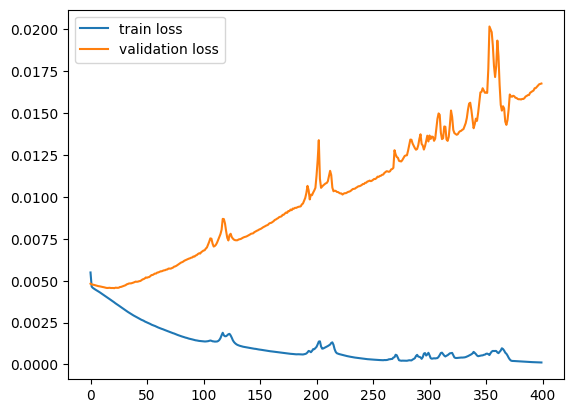

In [36]:
# todo: plot the train and validation loss by epoch
fig, ax = plt.subplots()
ax.plot(train_loss_arr, label='train loss')
ax.plot(val_loss_arr, label='validation loss')
ax.legend()

<div dir="rtl">
<font face="XB Zar" size=5>
</font>
<font face="XB Zar" size=3>
     <br>
نمودار f1 score بر حسب epoch را برای داده‌های train و validation رسم کنید.
    </font>
</div>

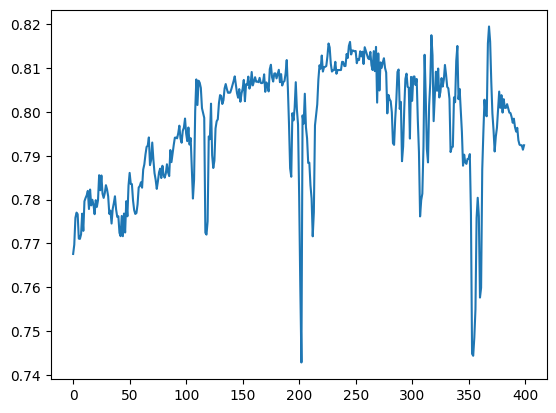

In [37]:
# todo: plot the f1 score by epoch
fig, ax = plt.subplots()
ax.plot(f1_macro_scores) 

## Evaluate model

<div dir="rtl">
<font face="XB Zar" size=5>
</font>
<font face="XB Zar" size=3>
     <br>
حال داده‌ی test را به مدلتان دهید و بر اساس خروجی‌ها موارد زیر را به دست آورید.
    <br>
    <br>
    <ul>
        <li>accuracy</li>
        <li>Loss</li>
        <li>F1-Macro</li>
        <li>F1-Micro</li>
        <li>Confusion matrix</li>
        <li>Macro-average precision</li>
        <li>Macro-average recall</li>
        <li>Micro-average precision</li>
        <li>Micro-average recall</li>
    </ul>
    </font>
</div>

In [38]:
# todo: evaluate the model on the test set
# print the required metrics
model.eval()
eval_loss, predicted_labels, true_labels, f1_score_macro = eval_epoch(model, criterion, test_loader, test_mode=True)


9it [00:00, 705.43it/s]


<div dir="rtl">
<font face="XB Zar" size=3>
     <br>
در نهایت در این قسمت تابعی بنویسید که یک متن را به عنوان ورودی بگیرد و بر اساس مدلتان برچسب‌ مناسب را به آن بدهد.
    <br>
    <br>
    </font>
</div>
    

In [39]:
inverse_classes = dict()
for key, value in classes.items():
  inverse_classes[value] = key
inverse_classes

{0: 'cs.CV', 1: 'cs.LG', 2: 'stat.ML'}

In [40]:
def predict(x):
    """
    predict the class code of a given query
    :param x: the query
    :return: the class of the query in the form of real strings.
    """
    x = FastText_model.get_query_embedding(x, TF_IDF_model.vectorizer)
    x = torch.tensor(x, dtype=torch.float32)
    x = x.to(device)
    predicted_class = inverse_classes[int(model(x).argmax())]
    return predicted_class

In [41]:
predict('hardware and computer architecture is good')

'cs.CV'

In [42]:
PATH = "nn_fasttext_model.pt"

# Save
torch.save(model, PATH)

<div dir="rtl">
<font face="XB Zar" size=5>
    <h1>
    <b>دسته بندی با استفاده از مدل های زبانی (۴۰ نمره)</b>
    </h1>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
     <br>
در این قسمت قرار است تا به کمک language modelهای از پیش آموزش شده 
و fine-tune کردن آن‌ها طبقه‌بند خودمان را درست کنیم.
</font>
</div>
   

## Requirements

In [43]:
import torch
import nltk
import numpy as np
import pandas as pd
from tqdm import tqdm
from nltk import word_tokenize
import string
from sklearn.model_selection import train_test_split
import torch
from transformers import BertTokenizer, BertForSequenceClassification, TrainingArguments, Trainer
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import random

## Read and preprocess data


<div dir="rtl">
<font face="XB Zar" size=5>
</font>
<font face="XB Zar" size=3>
     <br>
در ابتدا دیتا را لود کنید. آن را تمیز کنید یا به عبارتی EDA مناسب در حدی که داده‌های null یا موارد این‌چنینی نداشته باشیم، بر روی آن انجام دهید.
 پیش پردازش‌های مورد نیاز که در فاز قبل با آن آشنا شدید را روی داده انجام دهید.
    برای کتگوری هر مقاله برچسب اول آن را از دیتاست در نظر بگیرید.
</font>
</div>

In [44]:
# read data
df = pd.read_csv('./arxiv_data.csv')

# drop duplicates
df.drop_duplicates(subset=['titles'], inplace=True)

# equalize the counts of each class
labels = df['terms'].apply(lambda x: x.split("'")[1]).values
df = pd.concat([df[labels == 'cs.CV'].sample(3500, replace=True), df[labels == 'stat.ML'].sample(3500, replace=True), df[labels == 'cs.LG'].sample(3500, replace=True)]).sample(frac=1).reset_index().drop(columns=['index'])
df

,titles,summaries,terms
0,Distributed Variational Representation Learning,The problem of distributed representation lear...,"['stat.ML', 'cs.LG']"
1,Recovering Multiple Nonnegative Time Series Fr...,"Motivated by electricity consumption metering,...",['stat.ML']
2,Hierarchical Expert Networks for Meta-Learning,The goal of meta-learning is to train a model ...,"['stat.ML', 'cs.LG']"
3,EEG machine learning with Higuchi fractal dime...,Reliable diagnosis of depressive disorder is e...,"['stat.ML', 'cs.LG', 'q-bio.NC']"
4,Deep Active Contours Using Locally Controlled ...,Active contours Model (ACM) has been extensive...,['cs.CV']
...,...,...,...
10495,Robust Aggregation for Federated Learning,We present a robust aggregation approach to ma...,"['stat.ML', 'cs.CR', 'cs.LG']"
10496,On the Theory of Reinforcement Learning with O...,We study a theory of reinforcement learning (R...,"['cs.LG', 'cs.AI', 'stat.ML']"
10497,Pose Estimation for Non-Cooperative Spacecraft...,On-board estimation of the pose of an uncooper...,['cs.CV']
10498,Stereo Plane SLAM Based on Intersecting Lines,Plane feature is a kind of stable landmark to ...,['cs.CV']


In [45]:
# there is no nan
df.isna().sum(axis=0)

titles       0
summaries    0
terms        0
dtype: int64

In [46]:
def preprocess_text(text, minimum_length=1, stopword_removal=True, stopwords_domain=[], lower_case=True,
                       punctuation_removal=True):
    """
    preprocess text by removing stopwords, punctuations, and converting to lowercase, and also filter based on a min length
    for stopwords use nltk.corpus.stopwords.words('english')
    for punctuations use string.punctuation

    Parameters
    ----------
    text: str
        text to be preprocessed
    minimum_length: int
        minimum length of the token
    stopword_removal: bool
        whether to remove stopwords
    stopwords_domain: list
        list of stopwords to be removed base on domain
    lower_case: bool
        whether to convert to lowercase
    punctuation_removal: bool
        whether to remove punctuations
    """
    normalized_tokens = word_tokenize(text)

    if stopword_removal:
        # Remove stopwords in English and also the given domain stopwords
        stopwords = [x.lower() for x in nltk.corpus.stopwords.words('english')]
        domain_stopwords = [x.lower() for x in stopwords_domain]
        normalized_tokens = [word for word in normalized_tokens if word.lower() not in domain_stopwords + stopwords]

    if punctuation_removal:
        # Remove punctuations
        normalized_tokens = [word for word in normalized_tokens if word not in string.punctuation]

    if lower_case:
        # Convert everything to lowercase and filter based on a min length
        normalized_tokens = [word.lower() for word in normalized_tokens if len(word) > minimum_length]
    else:
        normalized_tokens = [word for word in normalized_tokens if len(word) > minimum_length]

    return normalized_tokens

In [47]:
# preprocess text
nltk.download('punkt')
nltk.download('stopwords')
df['preprocessed_abstract'] = df['summaries'].apply(lambda x: preprocess_text(x))
df['preprocessed_title'] = df['titles'].apply(lambda x: preprocess_text(x))
df.head()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,titles,summaries,terms,preprocessed_abstract,preprocessed_title
0,Distributed Variational Representation Learning,The problem of distributed representation lear...,"['stat.ML', 'cs.LG']","[problem, distributed, representation, learnin...","[distributed, variational, representation, lea..."
1,Recovering Multiple Nonnegative Time Series Fr...,"Motivated by electricity consumption metering,...",['stat.ML'],"[motivated, electricity, consumption, metering...","[recovering, multiple, nonnegative, time, seri..."
2,Hierarchical Expert Networks for Meta-Learning,The goal of meta-learning is to train a model ...,"['stat.ML', 'cs.LG']","[goal, meta-learning, train, model, variety, l...","[hierarchical, expert, networks, meta-learning]"
3,EEG machine learning with Higuchi fractal dime...,Reliable diagnosis of depressive disorder is e...,"['stat.ML', 'cs.LG', 'q-bio.NC']","[reliable, diagnosis, depressive, disorder, es...","[eeg, machine, learning, higuchi, fractal, dim..."
4,Deep Active Contours Using Locally Controlled ...,Active contours Model (ACM) has been extensive...,['cs.CV'],"[active, contours, model, acm, extensively, us...","[deep, active, contours, using, locally, contr..."


## Prepare data for model


<div dir="rtl">
<font face="XB Zar" size=5>
</font>
<font face="XB Zar" size=3>
     <br>
     در این قسمت برچسب‌ها و متن‌ها را برای مدل آماده کنید.
     برای متن هم عنوان و هم چکیده را در نظر بگیرید و این دو را به هم بچسبانید.
     به صورت رندم، ۱۰۰۰۰ داده را برای تمرین انتخاب کنید.
     همچنین جدا‌سازی داده‌ها را انجام دهید.
     در این بخش کافی است تا داده‌ها را به دو دسته‌ی آموزش و تست تقسیم کنید. 80% داده‌ها برای آموزش و 20% را برای تست قرار دهید.
    </font>
</div>

In [48]:
# todo
# calculate labels
# calulcate final texts
# select 10000 data randomly
# split data into train and test

# take first elements of the class
labels = df['terms'].apply(lambda x: x.split("'")[1]).values

# encode labels
classes = dict()
for i, classe in enumerate(np.unique(labels)):
  classes[classe] = i

# preprocess dataframe
x = (df['preprocessed_title'] + df['preprocessed_abstract']).apply(lambda x: ' '.join(x)).values.tolist()
y = df['terms'].apply(lambda x: classes[x.split("'")[1]]).values.tolist()

# split into train and test set
random_state = 1
X_train, X_test, y_train, y_test = train_test_split(x, y)

## Transformer based classification


<div dir="rtl">
<font face="XB Zar" size=5>
</font>
<font face="XB Zar" size=3>
     <br>
مدلی که در این قسمت استفاده می‌کنیم مدل معروف bert می‌باشد.
    برای این کار از کتابخانه transformers استفاده می‌کنیم.
    مدل و tokenizer مربوطه را لود کنید.
    <br><b><u>
    به کمک داده‌های قسمت قبل و به کمک 
    Trainer
    مربوط به کتاب‌خانه‌ی transformers عملیات fine-tune را انجام دهید.
    <br>
    همچنین یکبار وزن‌های مدل برت را فریز کنید و فقط دسته‌بند مربوطه را آموزش دهید.
    </u></b><br>
    مطالعه‌ی بیشتر کتاب‌خانه‌ی transformers بسیار توصیه می‌شود.
    </font>
</div>

In [49]:
MODEL_NAME = "bert-base-uncased"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# todo 
# you can add more cells here if you need
model = BertForSequenceClassification.from_pretrained(MODEL_NAME, num_labels = 3).to(device)
model_2 = BertForSequenceClassification.from_pretrained(MODEL_NAME, num_labels = 3).to(device)
tokenizer = BertTokenizer.from_pretrained(MODEL_NAME)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

In [50]:
# todo
train_encodings = tokenizer(X_train, truncation=True, padding=True, return_tensors='pt')
test_encodings = tokenizer(X_test, truncation=True, padding=True, return_tensors='pt')

In [51]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = CustomDataset(train_encodings, y_train)
test_dataset = CustomDataset(test_encodings, y_test)

In [52]:
# todo
# fine tune bert and train model
training_args = TrainingArguments(
    output_dir = "./outputs", 
    num_train_epochs=3,
    weight_decay=0.01
)

trainer = Trainer(
  model=model,                        
  args=training_args,           
  train_dataset=train_dataset, 
  eval_dataset=test_dataset          
)  

trainer.train()

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:407: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
<ipython-input-51-779cfa787fc0>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}


Step,Training Loss
500,0.749300
1000,0.635400
1500,0.546300
2000,0.494400
2500,0.412500


<ipython-input-51-779cfa787fc0>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
<ipython-input-51-779cfa787fc0>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
<ipython-input-51-779cfa787fc0>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
<ipython-input-51-779cfa787fc0>:7: UserWarning: To copy construct from a 

TrainOutput(global_step=2955, training_loss=0.5446835951958413, metrics={'train_runtime': 1572.8413, 'train_samples_per_second': 15.021, 'train_steps_per_second': 1.879, 'total_flos': 4200693075904500.0, 'train_loss': 0.5446835951958413, 'epoch': 3.0})

In [53]:
# todo
# freeze bert weights and then train model_2

# freeze layers of the first classifier
for param in model_2.bert.parameters():
    param.requires_grad = False

training_args2 = TrainingArguments(
    output_dir = "./outputs", 
    num_train_epochs=5,
    weight_decay=0.01
)

trainer2 = Trainer(
  model=model_2,                        
  args=training_args2,           
  train_dataset=train_dataset, 
  eval_dataset=test_dataset   
)  

trainer2.train()

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:407: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
<ipython-input-51-779cfa787fc0>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}


Step,Training Loss
500,1.102500
1000,1.087700
1500,1.078300
2000,1.073400
2500,1.066000
3000,1.061200
3500,1.061700
4000,1.055200
4500,1.053600


<ipython-input-51-779cfa787fc0>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
<ipython-input-51-779cfa787fc0>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
<ipython-input-51-779cfa787fc0>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
<ipython-input-51-779cfa787fc0>:7: UserWarning: To copy construct from a 

TrainOutput(global_step=4925, training_loss=1.0693882232511105, metrics={'train_runtime': 977.2355, 'train_samples_per_second': 40.292, 'train_steps_per_second': 5.04, 'total_flos': 7001155126507500.0, 'train_loss': 1.0693882232511105, 'epoch': 5.0})

## Evaluate model

<div dir="rtl">
<font face="XB Zar" size=3>
     <br>
حال داده‌ی test را به هر دو مدل بدهید و بر اساس خروجی‌ها موارد زیر را به دست آورید.
    <br>
    <br>
    <ul>
        <li>accuracy</li>
        <li>F1-Macro</li>
        <li>F1-Micro</li>
        <li>Confusion matrix</li>
        <li>Macro-average precision</li>
        <li>Macro-average recall</li>
        <li>Micro-average precision</li>
        <li>Micro-average recall</li>
    </ul>
    </font>
</div>

In [54]:
# you can add more cells here if you need
# todo
y_pred_transformers = trainer.predict(test_dataset).predictions.argmax(axis=1)
y_pred_transformers_2 = trainer2.predict(test_dataset).predictions.argmax(axis=1)

<ipython-input-51-779cfa787fc0>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}


In [55]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix
# calculate accuracy
accuracy = accuracy_score(y_test, y_pred_transformers)
print(f'accuracy of the model is: {accuracy}')

# cacluate micro and macro recall
micro_recall = recall_score(y_test, y_pred_transformers, average='micro')
macro_recall = recall_score(y_test, y_pred_transformers, average='macro')
print(f'micro and macro recall of the model are: {micro_recall, macro_recall}')

# calculate micro and macro precision
micro_precision = precision_score(y_test, y_pred_transformers, average='micro')
macro_precision = precision_score(y_test, y_pred_transformers, average='macro')
print(f'micro and macro precision of the model are: {micro_precision, macro_precision}')

# calculate micro and macro f1
micro_f1 = f1_score(y_test, y_pred_transformers, average='micro')
macro_f1 = f1_score(y_test, y_pred_transformers, average='macro')
print(f'micro and macro f1 of the model are: {micro_f1, macro_f1}')

accuracy of the model is: 0.795047619047619
micro and macro recall of the model are: (0.795047619047619, 0.7953291979438725)
micro and macro precision of the model are: (0.795047619047619, 0.7935842596128464)
micro and macro f1 of the model are: (0.795047619047619, 0.7943380468602893)


In [56]:
confusion_matrix(y_test, y_pred_transformers)

array([[809,  51,  14],
       [ 61, 624, 201],
       [ 28, 183, 654]])

In [57]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix
# calculate accuracy
accuracy = accuracy_score(y_test, y_pred_transformers_2)
print(f'accuracy of the model is: {accuracy}')

# cacluate micro and macro recall
micro_recall = recall_score(y_test, y_pred_transformers_2, average='micro')
macro_recall = recall_score(y_test, y_pred_transformers_2, average='macro')
print(f'micro and macro recall of the model are: {micro_recall, macro_recall}')

# calculate micro and macro precision
micro_precision = precision_score(y_test, y_pred_transformers_2, average='micro')
macro_precision = precision_score(y_test, y_pred_transformers_2, average='macro')
print(f'micro and macro precision of the model are: {micro_precision, macro_precision}')

# calculate micro and macro f1
micro_f1 = f1_score(y_test, y_pred_transformers_2, average='micro')
macro_f1 = f1_score(y_test, y_pred_transformers_2, average='macro')
print(f'micro and macro f1 of the model are: {micro_f1, macro_f1}')

accuracy of the model is: 0.5348571428571428
micro and macro recall of the model are: (0.5348571428571428, 0.53397852089276)
micro and macro precision of the model are: (0.5348571428571428, 0.5565569184491793)
micro and macro f1 of the model are: (0.5348571428571428, 0.535317004682482)


In [58]:
confusion_matrix(y_test, y_pred_transformers_2)

array([[539, 264,  71],
       [114, 539, 233],
       [ 96, 443, 326]])

<div dir="rtl">
<font face="XB Zar" size=3>
     <br>
     نتایج به دست آمده برای دو مدل آموزش داده شده را مقایسه کنید و سپس نتایج مدل بهتر را با خروجی‌های fasttext که در قسمت قبل استخراج کردید نیز مقایسه کنید و تحلیل‌های خود را بنویسید.
    <br>
    <br>
    </font>
</div>

<div dir="rtl">
<font face="XB Zar" size=3>
مدل fasttext بهتر عمل می‌کند به نظر دلیل این است که صرفا با یک لایه بعد از bert پیش بینی انجام می‌گردد ولی در قسمت قبل خروجی fasttext با یک لایه نهان ترکیب می‌گردد.
</font>
</div>

<div dir="rtl">
<font face="XB Zar" size=3>
     <br>
در نهایت در این قسمت تابعی بنویسید که یک متن را به عنوان ورودی بگیرد و بر اساس مدلتان برچسب‌ مناسب را به آن بدهد.
    <br>
    <br>
    </font>
</div>
    

In [59]:
inverse_classes = dict()
for key, value in classes.items():
  inverse_classes[value] = key
inverse_classes

{0: 'cs.CV', 1: 'cs.LG', 2: 'stat.ML'}

In [60]:
def predict(x, tokenizer, model):
    """
    predict the class code of a given query
    :param x: the query
    :return: the class of the query in the form of real strings.
    """
    # extract attention mask and input
    tokenized = tokenizer(x, return_tensors='pt')
    input_ids = tokenized['input_ids'].to(device)
    attention_mask = tokenized['attention_mask'].to(device)

    # feed input to the model
    predicted_class = model(input_ids=input_ids, attention_mask=attention_mask).logits.argmax(axis=1)
    return inverse_classes[int(predicted_class)]

In [61]:
predict('hardware is very good.', tokenizer, model)

'cs.LG'

In [62]:
# It is highly recommended to save your final models
trainer.save_model('./saved_model')
trainer2.save_model('./saved_model2')

<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>جستجو و بازیابی اسناد در دسته‌های مختلف</b>
    </h2>
</font>
<font face="XB Zar" size=4>
در این بخش می‌خواهیم به تابع search مربوط به فاز قبل قابلیتی اضافه کنیم که بر اساس آن بتوان جستجو و بازیابی پرسمان را به یک دسته خاص محدود کرد و یا مشخص کرد که جستجو بر روی تمام اسناد انجام شود. همانند فاز قبل:
<br>
 پرسمانی که از کاربر می‌گیرید را در مجموعه اسناد نمایه شده جست و جو کنید. توجه داشته باشید که جست و جویی که انجام می‌دهید هم باید در عنوان مقاله و هم در چکیده آن انجام شود. در نهایت، اسناد باید به ترتیب امتیاز نهایی‌شان برگردانده شوند. امتیاز نهایی هر سند نیز از جمع وزن‌دار امتیاز جستجو در عنوان و جستجو در چکیده مقاله به دست می‌آید.
<br>
ورودی‌های تابع search در این فاز، همانند فاز قبل است؛ تنها ورودی category به آن اضافه شده است. در صورتی که ورودی category برابر all باشد، جستجو در تمامی اسناد انجام می‌شود. در صورتی که category برابر نام یک دسته باشد، جستجو تنها در دسته گفته شده انجام می‌شود.
<br>
(برای این قسمت از کدهایی که در فاز قبل زده‌اید استفاده کنید و قابلیت گفته شده را به آن اضافه کنید.)
</font>
</div>

In [63]:
corpus = df[['preprocessed_title', 'preprocessed_abstract']]
classes = dict()
for i, classe in enumerate(np.unique(labels)):
  classes[classe] = i
labels = df['terms'].apply(lambda x: classes[x.split("'")[1]]).values.tolist()

In [64]:
def construct_positional_indexes(corpus : str):
    
    """
    Get processed data and insert words in that into a trie and construct postional_index and posting lists after wards.

    Parameters
    ----------
    corpus: str
        processed data 
    
    Return
    ----------
    docs: 
        list of docs with specificied id, title, abstract.
    """
    positional_index = dict()
    column_names = ['preprocessed_title', 'preprocessed_abstract']
    for i, row in corpus.iterrows():
      for column in column_names:
        for number, word in enumerate(row[column]):
          if not word in positional_index:
            positional_index[word] = dict()
          if not i in positional_index[word]:
            positional_index[word][i] = dict()
          if not column in positional_index[word][i]:
            positional_index[word][i][column] = list()
          positional_index[word][i][column].append(number)
    return positional_index
positional_index = construct_positional_indexes(corpus)
positional_index

{'distributed': {0: {'preprocessed_title': [0],
   'preprocessed_abstract': [1, 31, 100]},
  23: {'preprocessed_title': [9], 'preprocessed_abstract': [14]},
  63: {'preprocessed_abstract': [10]},
  77: {'preprocessed_abstract': [40]},
  81: {'preprocessed_title': [4]},
  118: {'preprocessed_title': [6]},
  133: {'preprocessed_title': [6]},
  162: {'preprocessed_abstract': [93]},
  187: {'preprocessed_abstract': [13]},
  281: {'preprocessed_abstract': [50]},
  341: {'preprocessed_abstract': [61]},
  343: {'preprocessed_abstract': [77]},
  368: {'preprocessed_abstract': [89]},
  370: {'preprocessed_abstract': [91]},
  375: {'preprocessed_abstract': [4]},
  389: {'preprocessed_title': [5],
   'preprocessed_abstract': [55, 72, 84, 98, 125]},
  420: {'preprocessed_abstract': [0]},
  455: {'preprocessed_abstract': [39]},
  468: {'preprocessed_title': [6]},
  479: {'preprocessed_title': [5],
   'preprocessed_abstract': [15, 25, 36, 47, 52]},
  511: {'preprocessed_abstract': [52]},
  680: {'pr

In [65]:
from math import log10, log, sqrt
title_representation = dict()
title_lengths = dict()
title_pure_lengths = dict()
abstract_representation = dict()
abstract_lengths = dict()
abstract_pure_lengths = dict()
for word, posting in positional_index.items():
    for doc, pos in posting.items():
        if 'preprocessed_title' in pos:
            if doc not in title_representation:
                title_representation[doc] = dict()
            title_representation[doc][word] = (1 + log10(len(pos['preprocessed_title']))) * log10(len(positional_index) / len(posting))
            title_pure_lengths[doc] = title_pure_lengths.get(doc, 0) + len(pos['preprocessed_title'])
        if 'preprocessed_abstract' in pos:
            if doc not in abstract_representation:
                abstract_representation[doc] = dict()
            abstract_representation[doc][word] = (1 + log10(len(pos['preprocessed_abstract']))) * log10(len(positional_index) / len(posting))
            abstract_pure_lengths[doc] = abstract_pure_lengths.get(doc, 0) + len(pos['preprocessed_abstract'])
for document in title_representation:
    title_lengths[document] = sqrt(sum([score for _, score in title_representation[document].items()]))
for document in abstract_representation:
    abstract_lengths[document] = sqrt(sum([score for _, score in abstract_representation[document].items()]))
title_average_lengths = sum([x for _, x in title_pure_lengths.items()]) / len(title_pure_lengths)
abstract_average_lengths = sum([x for _ , x in abstract_pure_lengths.items()]) / len(abstract_pure_lengths)
title_average_lengths

7.055142857142857

In [66]:
def search(title_query: str, abstract_query: str, max_result_count: int, method: str = 'ltn-lnn',\
           weight: float = 0.5, category = 'all'):
    """
        Finds relevant documents to query
        
        Parameters
        ---------------------------------------------------------------------------------------------------
        max_result_count: Return top 'max_result_count' docs which have the highest scores. 
                          notice that if max_result_count = -1, then you have to return all docs
        
        mode: 'detailed' for searching in title and text separately.
              'overall' for all words, and weighted by where the word apears on.
        
        method: 'ltn-lnn' or 'ltc-lnc' or 'okapi25'

        category: 'all' for searching in all documents. 
                  'category_name' for searching in a specific category with category_name label.

        Returns
        ----------------------------------------------------------------------------------------------------
        list
        Retreived documents with snippet
    """
    # TODO: retun top 'max_result_count' documents for your searched query
    title_score = dict()
    abstract_score = dict()
    # corrected_title_query = correct_text(title_query)
    # corrected_abstract_query = correct_text(abstract_query)
    corrected_title_query = preprocess_text(title_query)
    corrected_abstract_query = preprocess_text(abstract_query)
    title_counts = dict()
    abstract_counts = dict()
    for word in corrected_title_query:
        title_counts[word] = title_counts.get(word, 0) + 1
    for word in corrected_abstract_query:
        abstract_counts[word] = abstract_counts.get(word, 0) + 1
    # convert count to 1 + log(count)
    for word in title_counts:
        title_counts[word] = 1 + log(title_counts[word])
    for word in abstract_counts:
        abstract_counts[word] = 1 + log(abstract_counts[word])
    # normalize if ltc-lnc
    if method == 'ltc-lnc':
        title_count_length = sqrt(sum([value for (_, value) in title_counts.items()]))
        abstract_count_length = sqrt(sum([value for (_, value) in abstract_counts.items()]))
        for word in title_counts:
            title_counts[word] = title_counts[word] / title_count_length
        for word in abstract_counts:
            abstract_counts[word] = abstract_counts[word] / abstract_count_length
    # compute title_score and abstract_score separatly
    for word in title_counts:
        for document in positional_index[word]:
            if method == 'okapi25':
                title_score[document] = title_score.get(document, 0) + \
                log10(len(positional_index) / len(positional_index[word])) * \
                (2.2 * len(positional_index[word][document].get('preprocessed_title', [])))  / \
                (1.2 * (0.25 + 0.75 * title_pure_lengths.get(document, 0) / title_average_lengths) + len(positional_index[word][document].get('title', [])))
            else:
                title_score[document] = title_score.get(document, 0) + title_counts[word] * \
                title_representation.get(document, dict()).get(word, 0) / \
                (title_lengths.get(document, 1) if method == 'ltc-lnc' else 1)
    for word in abstract_counts:
        for document in positional_index[word]:
            if method == 'okapi25':
                abstract_score[document] = abstract_score.get(document, 0) + \
                log10(len(positional_index) / len(positional_index[word])) * \
                (2.2 * len(positional_index[word][document].get('preprocessed_abstract', [])))  / \
                (1.2 * (0.25 + 0.75 * abstract_pure_lengths.get(document, 0) / abstract_average_lengths) + len(positional_index[word][document].get('anstract', [])))
            else:
                abstract_score[document] = abstract_score.get(document, 0) + abstract_counts[word] * \
                abstract_representation.get(document, dict()).get(word, 0) / \
                (abstract_lengths.get(document, 1) if method == 'ltc-lnc' else 1)
    candidates = set(title_score.keys()) | set(abstract_score.keys())
    candidates = [candidate for candidate in candidates if labels[candidate] == classes[category]]
    total_score = []
    for candidate in candidates:
        total_score.append((candidate, weight * abstract_score.get(candidate, 0) + (1 - weight) * title_score.get(candidate, 0)))
    total_score.sort(key=lambda x:-x[1])
    result = [x[0] for x in total_score[:max_result_count]]

    return result

search('Translation Model Based on Deep Learning', 'Translation Model Based on Deep Learning', 10, 'okapi25', category = 'stat.ML')

[6316, 7152, 10231, 8093, 5732, 10023, 1626, 1722, 5491, 2163]

In [78]:
' '.join(corpus.loc[1722, 'preprocessed_abstract'])

'present deep transformation model probabilistic regression deep learning known outstandingly accurate predictions complex data regression tasks predominantly used predict single number ignores non-deterministic character tasks especially crucial decisions based predictions like medical applications essential quantify prediction uncertainty presented deep learning transformation model estimates whole conditional probability distribution thorough way capture uncertainty outcome combine ideas statistical transformation model likely transformation recent transformation models deep learning normalizing flows predict complex outcome distributions core method parameterized transformation function trained usual maximum likelihood framework using gradient descent method combined existing deep learning architectures small machine learning benchmark datasets report state art performance dataset partly even outperform method works complex input data demonstrate employing cnn architecture image da

<div dir="rtl">
<font face="XB Zar" size=6>
    <h1>
    <b>خوشه‌بندی (۴۰ نمره)</b>
    </h1>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
در این قسمت شما به خوشه‌بندی اسناد و استفاده از آن خوشه‌ها برای اهداف مختلف میپردازید. برای این منظور، ابتدا برای هر سند، بردار جاسازی (Embedding) تولید کرده و با استفاده از دو الگوریتم kmeans و خوشه‌بندی سلسله‌مراتبی (Hierarchical Clustering)، خوشه‌ها را ایجاد می‌کنید.
</font>
</div>

<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>استخراج بردار جاسازی اسناد</b>
    </h2>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
اگرچه امکان ایجاد بردار جاسازی برای هر سند با استفاده از روش ‌Bag of Words نیز وجود دارد، اما برای اینکه احتمالا بتوانید به نتابج بهتری در خوشه‌بندی برسید، در این قسمت از مدل‌های زبانی برمبنای مبدل‌ها (Transformers) برای استخراج این بردارها استفاده می‌کنید.
برای این منظور می‌توانید از
<a href="https://huggingface.co/">HuggingFace</a>
  و مدل‌های متعددی که در آن وجود دارد استفاده کنید.
  <br>
  در تابع extract_embedding پیاده‌سازی مورد نیاز را انجام دهید. این تابع لیستی از اسناد را به عنوان ورودی دریافت میکند و در خروجی لیستی از بردار‌های جاسازی متناظر با هر عنصر در ورودی را برمی‌گرداند.
  <br>
برای محاسبه بردار جاسازی هر سند، روش های مختلفی وجود دارد. استفاده از بردار جاسازی توکن CLS در مدل ‌BERT، میانگین‌گیری (وزن‌دار یا بدون وزن) از بردارهای جاسازی هر کلمه ورودی و ... از روش‌های موجود هستند که می‌توانید به دلخواه خود انتخاب کنید.
</font>
</div>

In [68]:
## ؟ points

from typing import List

def extract_embedding(doc_list : List):
    """Extracts embedding vector for each document in doc_list

    Parameters
    ----------
    doc_list : List
        A list of documents

    Returns
    -------
    list
        A list of embedding vectors
    """
    # tokenize and get the output
    encoded = tokenizer(doc_list, return_tensors="pt", padding=True, truncation=True)

    # define the dataset
    train_dataset = CustomDataset(encoded, [0] * len(doc_list))
    train_loader = DataLoader(train_dataset, batch_size=16)

    outputs = list()
    with torch.no_grad(), tqdm(enumerate(train_loader)) as pbar:
      for i, x in pbar:
        
        # put everything in cuda
        input_ids = x['input_ids'].to(device)
        attention_mask = x['attention_mask'].to(device)

        # get output and append it to the results
        output = model.bert(input_ids=input_ids, attention_mask=attention_mask)
        outputs.extend(output.pooler_output.detach().cpu().numpy().tolist())
    return np.array(outputs)

docs_embedding = extract_embedding(X_train) 

0it [00:00, ?it/s]<ipython-input-51-779cfa787fc0>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
493it [02:51,  2.88it/s]


<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>کاهش بعد بردارها برای رسم نمودار دوبعدی</b>
    </h2>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
برای اینکه بتوانید در مراحل بعدی، نتایج خوشه‌بندی را مشاهده کنید، در این قسمت به پیاده‌سازی تابع کاهش بعد بردارهای جاسازی با استفاده از روش T-SNE می‌پردازید.
برای اینکار تابع convert_to_2d_tsne را پیاده‌سازی می‌کنید که لیستی از بردارهای جاسازی را به عنوان ورودی دریافت می‌کند و در خروجی، لیستی از بردارهای جاسازی کاهش بعد داده شده به دو بعد را تولید می‌کند. برای پیاده سازی این تابع می‌توانید از کتابخانه‌های آماده استفاده کنید.
<br>
توجه کنید که از بردارهای خروجی این قسمت <u>صرفا برای رسم نمودار</u> استفاده می‌کنید و تمامی مراحلی که در ادامه طی می‌کنید (به جز رسم نمودار)، باید با استفاده از بردارهای کاهش بعد داده <u>نشده</u> انجام شوند.
</font>
</div>

In [69]:
## ؟ points

from typing import List

def convert_to_2d_tsne(emb_vecs : List):
    """Converts each raw embedding vector to 2d vector 

    Parameters
    ----------
    emb_vecs : List
        A list of vectors

    Returns
    -------
    list
        A list of 2d vectors
    """

    # TODO: Convert each input vector to 2d vector 
    from sklearn.manifold import TSNE
    return TSNE(2).fit_transform(emb_vecs)
docs_embedding_2d = convert_to_2d_tsne(docs_embedding)

<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>رسم نمودار</b>
    </h2>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
در این قسمت، تابع plot_docs را پیاده‌سازی می‌کنید که لیستی از بردارهای کاهش بعد داده شده و لیستی از شماره‌ خوشه‌‌های هربردار (برای رنگ‌آمیزی نقاط) را به عنوان ورودی دریافت کرده و نمودار دوبعدی ای را رسم می‌کند که در آن به هر خوشه یک رنگ مجزا اختصاص داده شده است و هر سند به عنوان یک نقطه نشان داده می‌شود که به رنگ خوشه‌ای است که به آن نسبت داده شده است. 
</font>
</div>



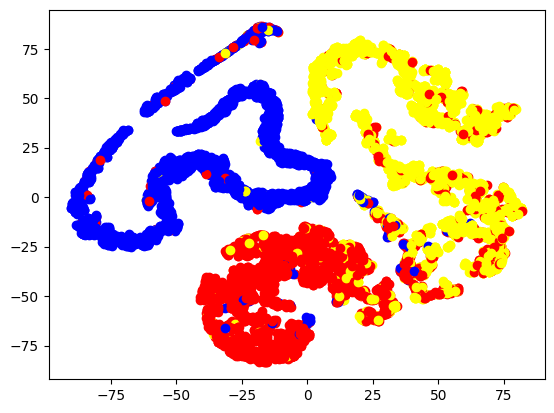

In [70]:
## ؟ points

from typing import List

def plot_docs(emb_vecs_2d: List, labels : List, ax=None):
    """Draws a 2d plot of input vectors

    Parameters
    ----------
    emb_2d_vecs : List
        A list of 2d vectors

    Returns
    -------
    """

    # TODO: Draw a 2d plot from input vectors and color each cluster with specific color.
    if ax is None:
      _, ax = plt.subplots()
    colors=['blue', 'red', 'yellow', 'green', 'black']
    for embedding, label in zip(emb_vecs_2d, labels):
      ax.scatter(*embedding, c=colors[label])
plot_docs(docs_embedding_2d, y_train, plt.subplots()[1])

<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>خوشه‌بندی مستندها</b>
    </h2>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
در این قسمت شما به خوشه‌بندی اسناد با استفاده از بردارهای جاسازی مستخرج از مدل زبانی با دو روش Kmeans و خوشه‌بندی سلسله‌مراتبی می‌پردازید.
</font>
</div>

<div dir="rtl">
<font face="XB Zar" size=4>
    <h3>
    <b>روش K-means</b>
    </h3>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
در این قسمت، شما ابتدا الگوریتم خوشه‌بندی K-means را 
<u><b>از پایه</b></u>
 پیاده‌سازی کرده و سپس با استفاده از آن، خوشه‌های اسناد را ایجاد می‌کنید. الگوریتم را با استفاده از چند مقدار مختلف تعداد خوشه‌ها (k) اجرا کنید. در هربار اجرا، با استفاده از تعدادی از اسناد موجود در هر خوشه، موضوع آن خوشه را تعیین کرده و خوشه‌بندی حاصله را با استفاده از بردار‌های دوبعدی قسمت قبل، رسم کنید. با اینکار، پیاده‌سازی خود و همچنین کارایی این الگوریتم در خوشه‌بندی اسناد و قرار دادن اسناد مشابه در خوشه‌های یکسان را بررسی کنید.
<br>
 نمودار silhouette score برای مقدار‌های محتلف k را رسم کرده و silhouette analysis برای انتخاب k مناسب انجام دهید. 
 همچنین با استفاده از داده‌های دارای برچسب، مقدار purity به ازای k را رسم کرده و مقدار purity برای k نهایی را گزارش کنید.
<br>
پیاده‌سازی خود را در تابع cluster_kmeans قرار دهید. این تابع یک لیست از بردارهای جاسازی دریافت کرده و در خروجی، مختصات مرکز هر خوشه را به همراه لیستی از شماره خوشه‌های متناظر با هر بردار جاسازی تولید می‌کند.
توجه کنید که الگوریتم می‌بایست از پایه پیاده‌سازی شود و امکان استفاده از پیاده‌سازی‌های آماده آن وجود ندارد.
</font>
</div>

In [71]:
## ؟ points

from typing import List

def cluster_kmeans(emb_vecs : List, n_clusters : int):
    """Clusters input vectors using K-means method

    Parameters
    ----------
    emb_vecs : List
        A list of vectors

    Returns
    -------
    list
        Two lists: 1) A list containing cluster centers 2) A list containing cluster index for each input vector
    """

    # initialize centers
    n_points = len(emb_vecs)
    cluster_centers = np.random.choice(n_points, size=n_clusters, replace=False)
    cluster_centers = emb_vecs[cluster_centers]
    cluster_index = np.zeros(n_points)
    num_iterations = 100

    for i in range(num_iterations):
        # assign points to cluster centers
        cluster_index = ((emb_vecs[:, np.newaxis, :] - cluster_centers) ** 2).sum(axis=2).argmin(axis=1)

        # relocate the centers
        for j in range(n_clusters):
            cluster_centers[j] = emb_vecs[cluster_index == j].mean(axis=0)

    return cluster_centers, cluster_index.astype(int)

cluster_centers, cluster_indices = cluster_kmeans(docs_embedding, 3) 

<ipython-input-72-b86998c0e4fb>:25: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  leg.legendHandles[j].set_color(colors[j])
<ipython-input-72-b86998c0e4fb>:25: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  leg.legendHandles[j].set_color(colors[j])
<ipython-input-72-b86998c0e4fb>:25: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  leg.legendHandles[j].set_color(colors[j])
<ipython-input-72-b86998c0e4fb>:25: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  leg.legendHandles[j].set_color(colors[j])


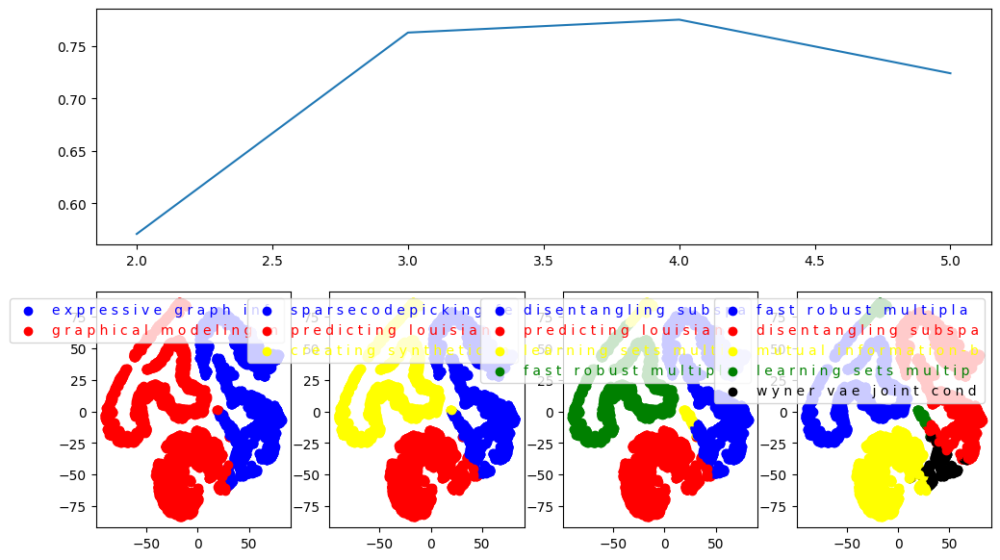

In [72]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.gridspec as gridspec
#TODO: silhouette analysis 
colors=['blue', 'red', 'yellow', 'green', 'black']
cluster_numbers = [i for i in range(2, 6)]
silhouette_scores = []
max_silhouette = -1
best_num_clusters = -1
fig = plt.figure(figsize=(12, 7))
gs = gridspec.GridSpec(2, 4)
for i in cluster_numbers:
  cluster_centers, cluster_indices = cluster_kmeans(docs_embedding, i)
  silhouette = silhouette_score(docs_embedding, cluster_indices)
  silhouette_scores.append(silhouette)
  ax = fig.add_subplot(gs[1, i - 2])
  plot_docs(docs_embedding_2d, cluster_indices, ax)
  titles = []
  for j in range(i):
    related_index = ((cluster_centers[j] - docs_embedding) ** 2).sum(axis=1).argmin()
    short_title = ' '.join(X_train[related_index][:20])
    titles.append(short_title)
  ax.legend(titles, labelcolor=colors[:i])
  leg = ax.get_legend()
  for j in range(i):
    leg.legendHandles[j].set_color(colors[j])
  if silhouette > max_silhouette:
    max_silhouette = silhouette
    best_num_clusters = i
ax = fig.add_subplot(gs[0, :])
ax.plot(cluster_numbers, silhouette_scores);

In [73]:
#TODO: plot purity for different value of k
cluster_centers, cluster_indices = cluster_kmeans(docs_embedding, best_num_clusters)
total_true = 0
for i in range(best_num_clusters):
  total_true += np.bincount(np.array(y_train)[cluster_indices == i]).max()
print(f'The purity for k = {best_num_clusters} is {total_true / len(y_train)}')

The purity for k = 4 is 0.8948571428571429


<div dir="rtl">
<font face="XB Zar" size=4>
    <h3>
    <b>روش خوشه‌بندی سلسله‌مراتبی (Hierarchical Clustering)</b>
    </h3>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
تکنیک خوشه‌بندی سلسله مراتبی یکی از تکنیک‌های خوشه‌بندی در یادگیری ماشین است. در این قسمت شما می‌توانید از لایببری scipy یا هر لایبرری دیگری در پایتون استفاده کنید تا داده‌ها را به صورت سلسله‌مراتبی خوشه‌بندی کنید. سپس می‌توانید خوشه‌ها را با matplotlib مشاهده کنید.
</font>
</div>

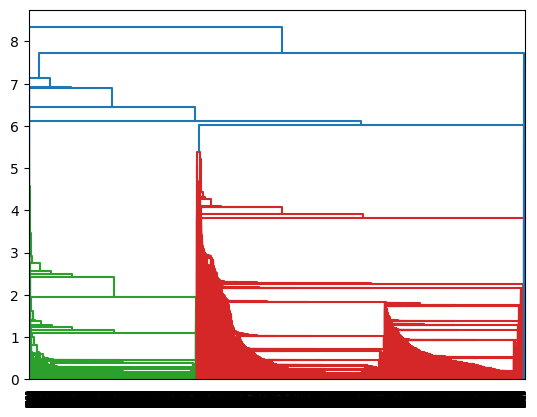

In [74]:
import scipy.cluster.hierarchy as shc
import matplotlib.pyplot as plt
import sys

sys.setrecursionlimit(10000)
fig, ax = plt.subplots()
result = shc.linkage(docs_embedding, 'single')
shc.dendrogram(result, ax=ax);

<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>خوشه‌بندی خروجی‌های سیستم جستجو فاز ۱</b>
    </h2>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
در این قسمت شما به افزودن قابلیت خوشه‌بندی در سیستم جستجویی که در فاز ۱ درس توسعه داده‌اید می‌پردازید. برای این منظور، توابعی که تابحال پیاده‌سازی کرده‌اید را به نحوی به سامانه جستجوی فاز ۱ خود اضافه می‌کنید که اسناد خروجی سامانه را خوشه‌بندی کرده و در نمایش خروجی،‌ اسنادی که در یک خوشه هستند را مشخص کند.
می‌توانید با فراخوانی توابعی که در فاز ۱ پیاده‌سازی کرده‌اید و ایجاد تغییر در آن‌ها در سلول زیر، این‌کار را انجام دهید. نحوه پیاده‌سازی این بخش به عهده خودتان است.
</font>
</div>

In [75]:
def cluster_results(results):
  texts = [' '.join(corpus.loc[result, 'preprocessed_title'] + corpus.loc[result, 'preprocessed_abstract']) for result in results]
  embeddings = extract_embedding(texts)
  _, cluster_indices = cluster_kmeans(embeddings, best_num_clusters)
  return cluster_indices
results = search('Translation Model Based on Deep Learning', 'Translation Model Based on Deep Learning', 10, 'okapi25', category = 'stat.ML')
indices = cluster_results(results)
list(zip(results, indices))

0it [00:00, ?it/s]<ipython-input-51-779cfa787fc0>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
1it [00:00,  8.07it/s]
<ipython-input-71-d6e6282d5005>:32: RuntimeWarning: Mean of empty slice.
  cluster_centers[j] = emb_vecs[cluster_index == j].mean(axis=0)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


[(6316, 1),
 (7152, 1),
 (10231, 1),
 (8093, 1),
 (5732, 1),
 (10023, 1),
 (1626, 1),
 (1722, 1),
 (5491, 1),
 (2163, 1)]

<div dir="rtl">
<font face="XB Zar" size=5>
    <h2>
    <b>جست‌و‌جوی اسناد مشابه با یک سند</b>
    </h2>
    <p></p>
    <p></p>
</font>
<font face="XB Zar" size=3>
در این قسمت، شما به پیاده‌سازی تابع find_similar_docs می‌پردازید که در آن با دریافت اندیس یک سند در مجموعه دادگان، تعداد اسناد مشابه مورد نظر و لیست بردارهای جاسازی، اندیس اسناد مشابه با آن در مجموعه دادگان را در خروجی تولید می‌کند. برای این منظور، به تعداد num_of_similar_docs تا از نزدیک‌ترین بردارها را به بردار مدنظر پیدا کرده و اندیس آن‌ها را به عنوان خروجی برمیگردانید. اسناد مشابه باید به ترتیب شباهت (مقدار شباهت بردار جاسازی آن‌ها به بردار جاسازی سند ورودی) مرتب شده باشند. انتخاب معیار شباهت برعهده خودتان است.
</font>
</div>

In [76]:
## ؟ points

from typing import List

def find_similar_docs(input_doc_index : int,
                      num_of_similar_docs: int,
                      emb_vecs : List):
    """Finds similar documents to input in dataset

    Parameters
    ----------
    input_doc_index: int
        Index of input document vector in emb_vecs list to search for specific paper

    num_of_similar_docs:
        Number of similar documents to return 

    emb_vecs : List
        A list of vectors corresponding to documents

    Returns
    -------
    List
        A list of similar document indexes to input document
    """

    # compute distances to each embedding
    distances = ((emb_vecs - emb_vecs[input_doc_index]) ** 2).sum(axis=1)

    # return the top nearest embeddings
    return distances.argsort()[:num_of_similar_docs]

similar_docs = find_similar_docs(1, 5, docs_embedding)

In [77]:
docs = [X_train[r] for r in similar_docs]
docs

['stop explaining black box machine learning models high stakes decisions use interpretable models instead black box machine learning models currently used high stakes decision-making throughout society causing problems throughout healthcare criminal justice domains people hoped creating methods explaining black box models alleviate problems trying \\textit explain black box models rather creating models \\textit interpretable first place likely perpetuate bad practices potentially cause catastrophic harm society way forward -- design models inherently interpretable manuscript clarifies chasm explaining black boxes using inherently interpretable models outlines several key reasons explainable black boxes avoided high-stakes decisions identifies challenges interpretable machine learning provides several example applications interpretable models could potentially replace black box models criminal justice healthcare computer vision',
 'stop explaining black box machine learning models hig